In [1]:
import networkx as nx
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import numpy as np
import scipy.stats as stats
import seaborn as sns
import sklearn
import glob
import os

# Suppress scientific notation for pandas
pd.options.display.float_format = '{:.10f}'.format

In [2]:
# Set parameters for all matplotlib/seaborn plots
mpl.rcParams["text.usetex"] = True
#mpl.rc("font", family = "serif", size = "24")
mpl.rcParams['figure.dpi']= 150

In [3]:
# Read all files in folder
# taken from: https://stackoverflow.com/questions/20906474/import-multiple-csv-files-into-pandas-and-concatenate-into-one-dataframe
files = glob.glob(os.path.join("IC data", "*.csv"))

trade_df = pd.concat((pd.read_csv(file, index_col = None, header = 0) for file in files), axis = 0, ignore_index = True)

trade_df.head()

,AltQuantity,CIFValue,FOBValue,GrossWeight,IsLeaf,NetWeight,TradeQuantity,TradeValue,aggrLevel,cmdCode,...,qtAltCode,qtAltDesc,qtCode,qtDesc,rgCode,rgDesc,rt3ISO,rtCode,rtTitle,yr
0,nan,nan,nan,nan,0,1.0000000000,nan,214,4,8542,...,nan,nan,1,No Quantity,1,Import,ARG,32,b'Argentina',2013
1,nan,nan,nan,nan,0,0.0000000000,nan,120,4,8542,...,nan,nan,1,No Quantity,2,Export,ARG,32,b'Argentina',2013
2,nan,nan,nan,nan,0,4.0000000000,nan,1043,4,8542,...,nan,nan,1,No Quantity,1,Import,ARG,32,b'Argentina',2013
3,nan,nan,nan,nan,0,34.0000000000,nan,7497,4,8542,...,nan,nan,1,No Quantity,1,Import,AUS,36,b'Australia',2013
4,nan,nan,nan,nan,0,15.0000000000,0.0000000000,2865,4,8542,...,nan,nan,1,No Quantity,2,Export,AUT,40,b'Austria',2013


In [4]:
# Read CPI_US file
cpi_df = pd.read_csv("Other Data/US_CPI.csv", index_col = None, header = 0)
cpi_df

,year,CPI
0,2013,106.8338489000
1,2014,108.5669321000
2,2015,108.6957220000
3,2016,110.0670089000
4,2017,112.4115573000


## 1. Pre-Processing the Data

The data is structured as follows:
1. There are two datasets for each country, corresponding to exports and imports. This is indicated by the column `rgDesc`. The export and import data should correctly line up with each other but since the data is in the reporting country's currency transmuted to US dollars, there will be discrepancies. Thus, we will average the import and export data.

2. The dataset corresponds to IC trade for years 2013-2017. This is indicated by the column `yr`.

3. The trading partners (in three-letter code) are indicated by the columns `rt3ISO` and `pt3ISO`. The full country names are indicated by the columns `rtTitle` and `ptTitle`. These correspond to the reporting country and the partner country, respectively. 

4. The trade value in US dollars is indicated by the column `TradeValue`.

<b> NOTE: </b> There is an issue with using only exports since if the reporting country has a devalued currency (e.g., China), the exports will appear to be larger than they really are. There is also an issue with using nominal US dollar figures since it would be difficult to make year-on-year comparisons. To remedy this, we can deflate the figures and just average export and import data, as in Fagiolo, Reyes & Schiavo (2008).

Given this, we implement the following strategy for cleaning the dataset:
1. Remove all irrelevant columns.
2. Change names of the remaining columns.
3. Remove all values for which `rt3ISO` and `pt3ISO`are `nan`. These refer to areas not elsewhere specified (NES), which is used to account for either (a) low value trade or (b) unkown or erroneous designation of trading partners. (Refer to source: https://unstats.un.org/unsd/tradekb/Knowledgebase/50042/Areas-not-elsewhere-specified for details). 
4. Separate import from export data.
5. Merge import and export data and average the two values
6. Deflate the trade figures using `cpi`

The procedures are implemented in the cells below.

In [5]:
# Drop columns
trade_df = trade_df[["yr", "rt3ISO", "pt3ISO", "rgDesc", "TradeValue"]]

# Change column names
trade_df.columns = ["year", "reporter", "partner", "indicator", "weight"]

# Remove rows with nans
trade_df.dropna(inplace = True)

# Change year to ints
trade_df["year"] = trade_df["year"].apply(lambda x: int(x))

trade_df.head()

,year,reporter,partner,indicator,weight
0,2013,ARG,AFG,Import,214
1,2013,ARG,DZA,Export,120
2,2013,ARG,ASM,Import,1043
3,2013,AUS,ASM,Import,7497
4,2013,AUT,ALB,Export,2865


In [6]:
# Separate imports from exports 
trade_exports = trade_df[trade_df["indicator"] == "Export"].reset_index(drop = True)
trade_imports = trade_df[trade_df["indicator"] == "Import"].reset_index(drop = True)

# Merge import and export dataframes
trade_df = trade_exports.merge(trade_imports, left_on = ["year", "reporter", "partner"], right_on = ["year", "partner", "reporter"], suffixes = ("_exp", "_imp"))

# Drop unnecessary columns
trade_df.drop(["reporter_imp", "partner_imp", "indicator_exp", "indicator_imp"], axis = 1, inplace = True)

# Change name of other columns
trade_df.rename(columns = {"reporter_exp": "source", "partner_exp": "target"}, inplace = True)

# Average weight_exp and weight_imp
trade_df["weight"] = (trade_df["weight_exp"] + trade_df["weight_imp"]) / 2

# Drop weight columns
trade_df.drop(["weight_exp", "weight_imp"], axis = 1, inplace = True)

trade_df.head()

,year,source,target,weight
0,2013,BEL,DZA,297121.0000000000
1,2013,CHN,ALB,157632.5000000000
2,2013,CHN,DZA,6747568.0000000000
3,2013,CZE,ALB,17974.0000000000
4,2013,CZE,DZA,4759502.0000000000


In [7]:
# Express CPI where with 2013 as base year (i.e., divide all values by the 2013 CPI) to get deflation factor
base = cpi_df.loc[cpi_df["year"] == 2013, "CPI"]
cpi_df["CPI"] = cpi_df["CPI"].apply(lambda x: x / base)
cpi_df

,year,CPI
0,2013,1.0000000000
1,2014,1.0162222294
2,2015,1.0174277452
3,2016,1.0302634421
4,2017,1.0522091870


In [8]:
# Multiply trade figures by deflation factor based on year
trade_df = trade_df.merge(cpi_df, on = "year")
trade_df["weight"] = trade_df["weight"] * trade_df["CPI"]

# Drop CPI column
trade_df.drop(["CPI"], axis = 1, inplace = True)

trade_df.head()

,year,source,target,weight
0,2013,BEL,DZA,297121.0000000000
1,2013,CHN,ALB,157632.5000000000
2,2013,CHN,DZA,6747568.0000000000
3,2013,CZE,ALB,17974.0000000000
4,2013,CZE,DZA,4759502.0000000000


In addition to the steps outlined above, we would also want to minimize the number of closed loops in the network in light of the simulation in the later part. For example, if China reduced its exports to other countries, it would impact some of its trading partners like the Philippines. This would then induce a shock to the Philippines that it can transmit back to China, which now reduces its exports to the Philippines in response. As a result, the shock to China forms a feedback loop between China and the Philippines, and they end up reducing their exports to each other during every iteration of the simulation.

To prevent this from happening, we construct a network with net trade flows. The steps in doing so are outlined below. 

In [9]:
# Merge trade with itself 
trade_new = trade_df.merge(trade_df, left_on = ["year", "source", "target"], right_on = ["year", "target", "source"], suffixes = ("_1", "_2"))

# Get net trade flow
trade_new["weight"] = trade_new["weight_1"] - trade_new["weight_2"]

# Delete all rows where weight is negative. Reset row indices
trade_new = trade_new[trade_new["weight"] > 0]
trade_new = trade_new.reset_index(drop = True)

# Drop extraneous columns and rename other columns
trade_new.drop(["weight_1", "source_2", "target_2", "weight_2"], axis = 1, inplace = True)
trade_new.rename(columns = {"source_1": "source", "target_1": "target"}, inplace = True)
trade_df = trade_new

trade_df.head()

,year,source,target,weight
0,2013,FRA,DZA,1217155.5000000000
1,2013,DEU,ALB,34562.0000000000
2,2013,ITA,ALB,1339425.0000000000
3,2013,NLD,ALB,18966.5000000000
4,2013,CRI,BEL,42087.5000000000


## 2. Graphing the Network

We then proceed with visualizing the network. We'll use the `networkx` package to construct and visualize the network.

### 2.1 Using NetworkX

We first create a dictionary with the years as keys and the trade relationships between countries as values. These will serve as the links/edges in the network. 

At the same time, we will also create a dictionary with the years as keys and the list of countries trading in that year as values. These will serve as the nodes in the network.

So as not to end up with a cluttered visualization, we may want to filter the links and countries per year based on which links are higher than average for the given year. These are stored in their respective variables. 

In [10]:
# Make a list of all years
years = sorted(list(set(trade_df["year"])))

# Initialize dictionaries
all_links = {}
all_countries = {}

for year in years:
    
    # Get subset of trade dataframe based on yeark
    trade_sub = trade_df[trade_df["year"] == year]
    
    # Get set of all sources, targets and links
    sources = set(trade_sub["source"])
    targets = set(trade_sub["target"])
    links = trade_sub[["source", "target", "weight"]].values.tolist()
    
    # Take the union of the set of source countries and the set of target countries to form set of nodes
    countries = list(sources.union(targets))
    
    # Assign links and countries to dictionary
    all_links[year] = links
    all_countries[year] = countries

We can now use this to create our networkx graphs. We first initialize the DiGraphs (short for directed graphs) and then construct the nodes from the country codes and the edges from the links. 

In [11]:
# Create mapping from year to graph
all_graphs = {}

for year in years:
    all_graphs[year] = nx.DiGraph()
        
# Create nodes
for year in years:
    all_graphs[year].add_nodes_from(all_countries[year])
    
# Create edges
for year in years:
    all_graphs[year].add_weighted_edges_from(all_links[year])

After creating the graphs for each year, we plot them using the `matplotlib.pyplot` package. We use a force-directed layout so that closely connected nodes are closer to each other.

C:\Users\JM\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
C:\Users\JM\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:676: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if cb.iterable(node_size):  # many node sizes


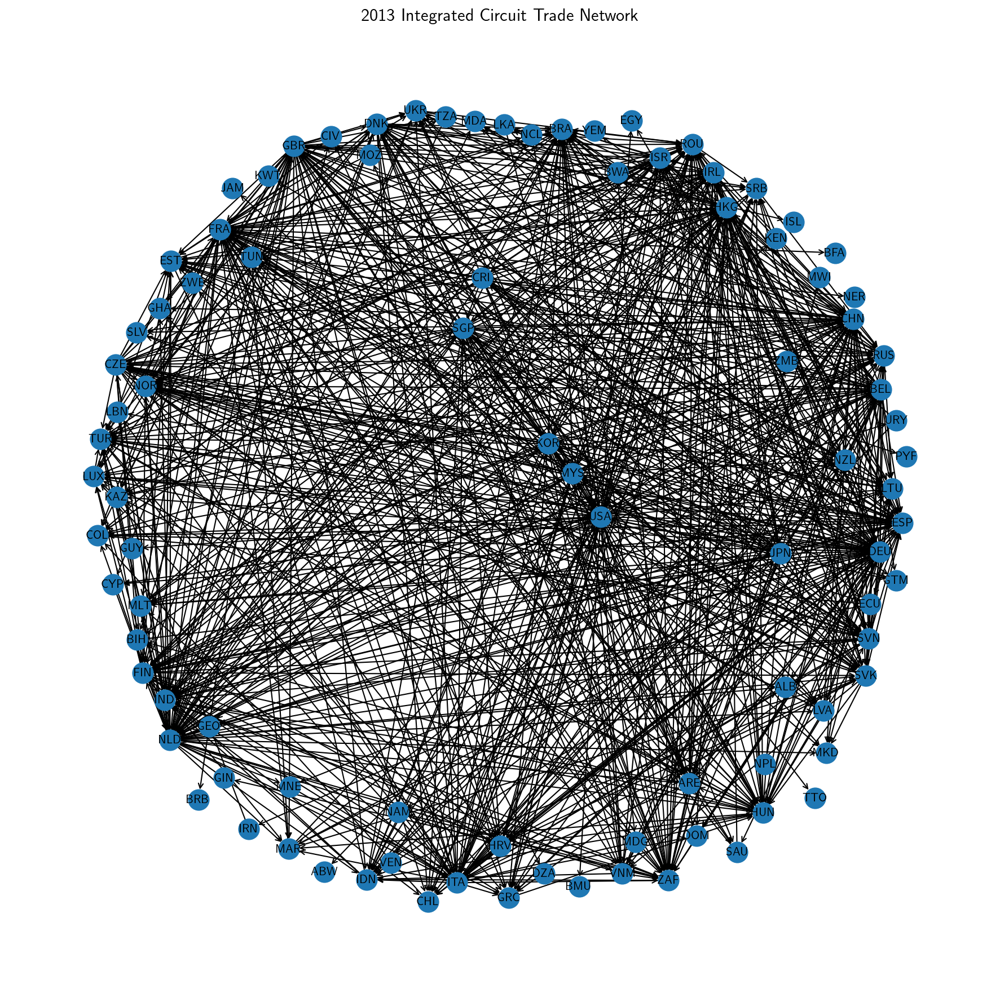

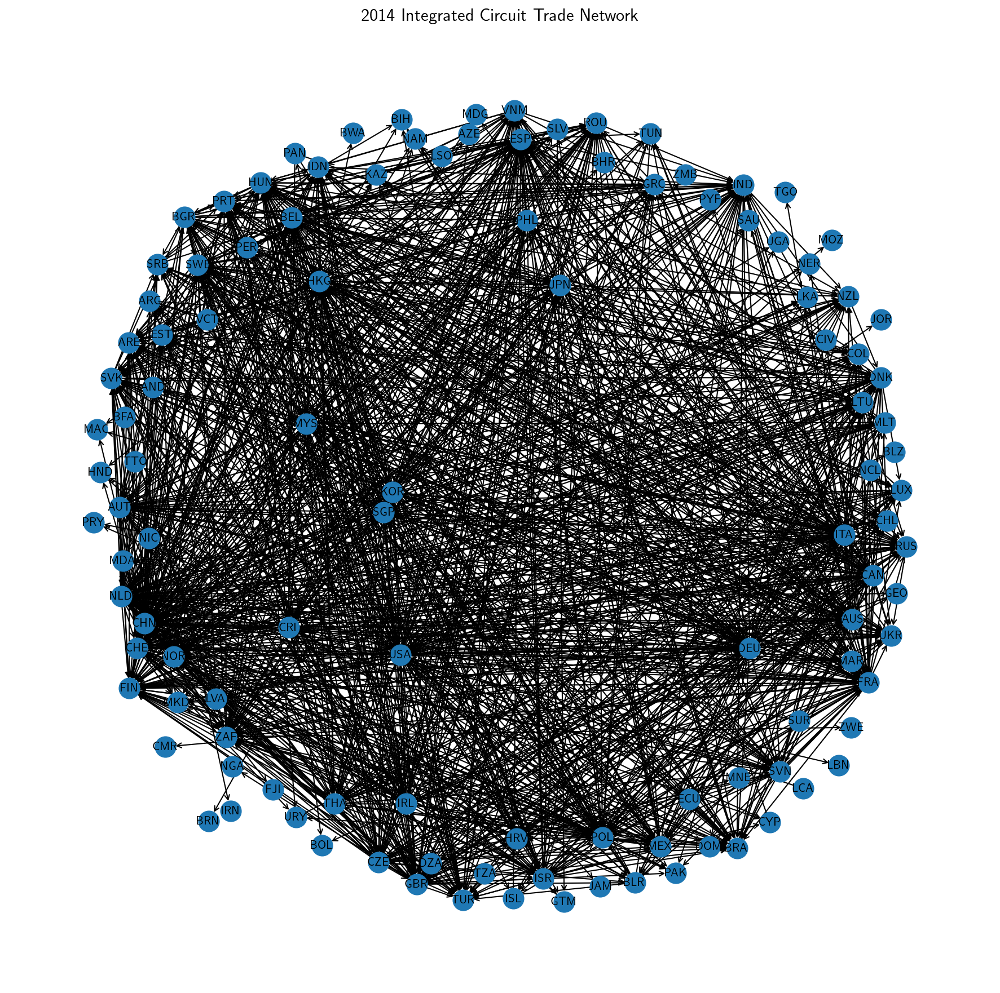

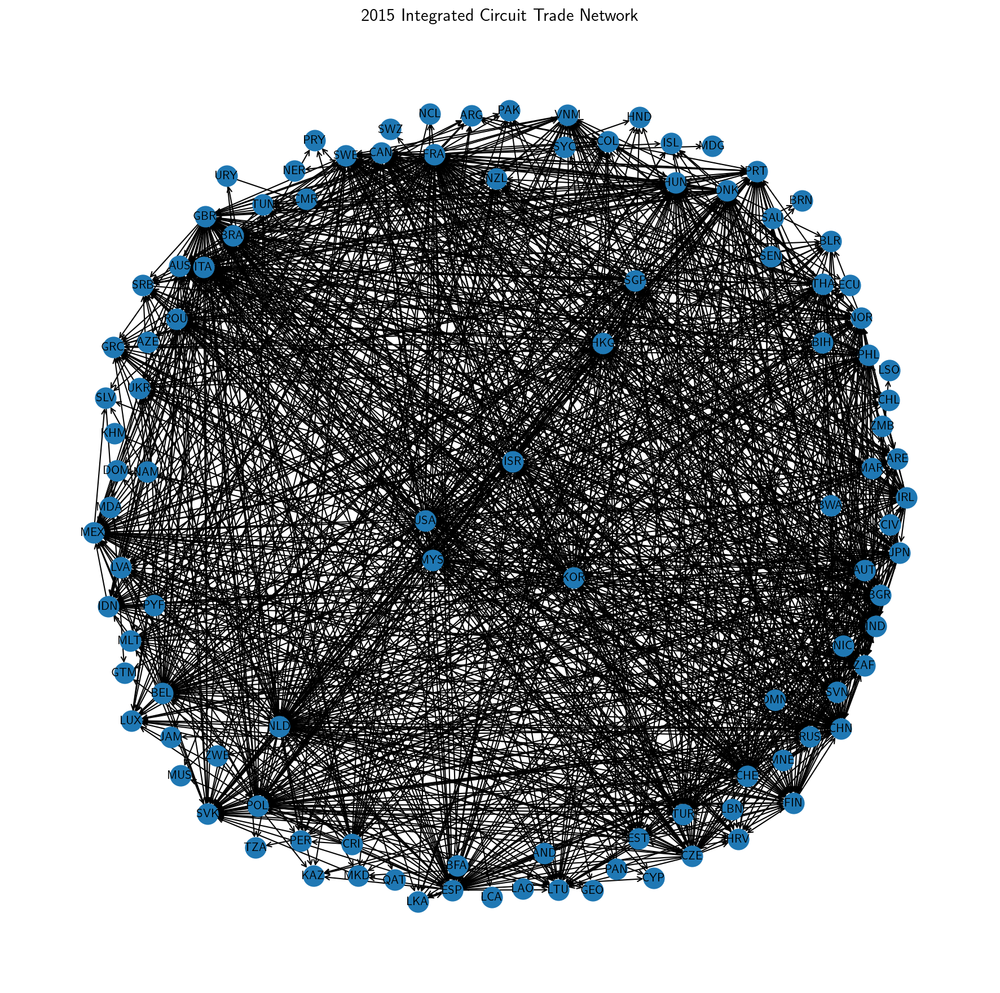

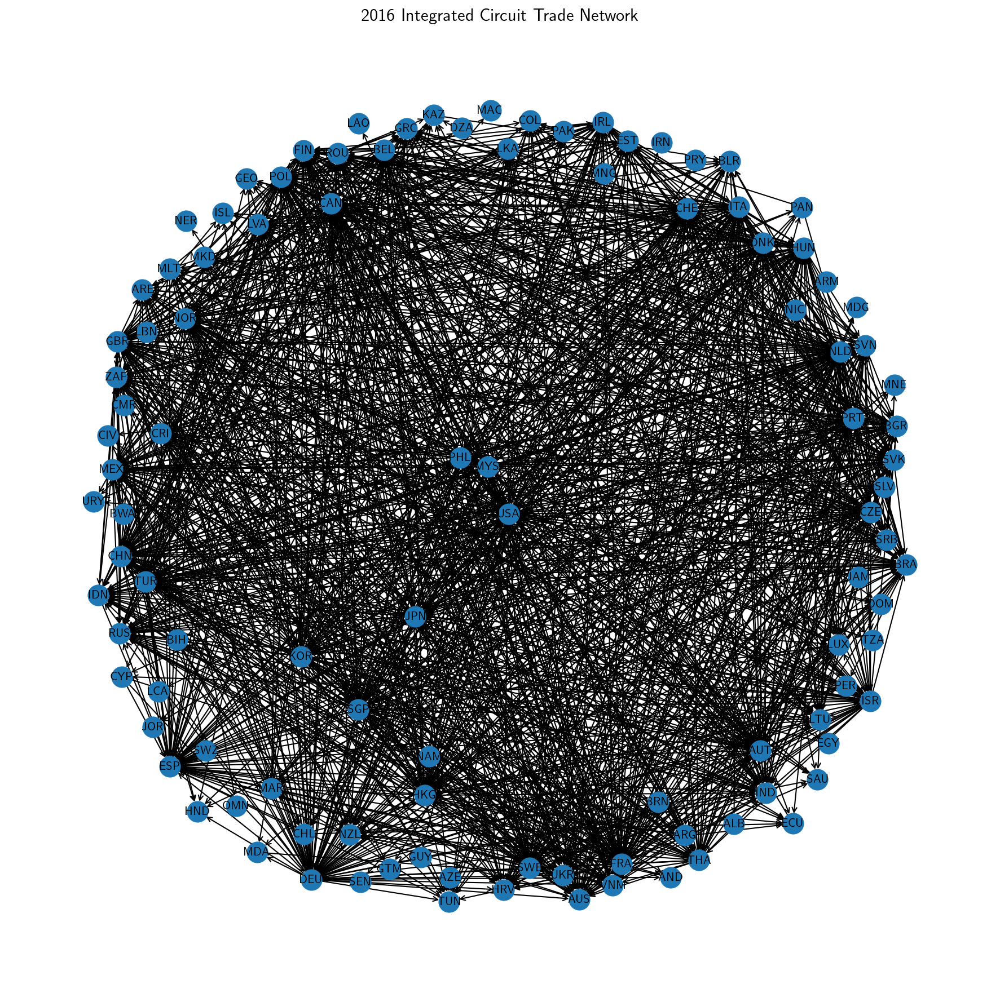

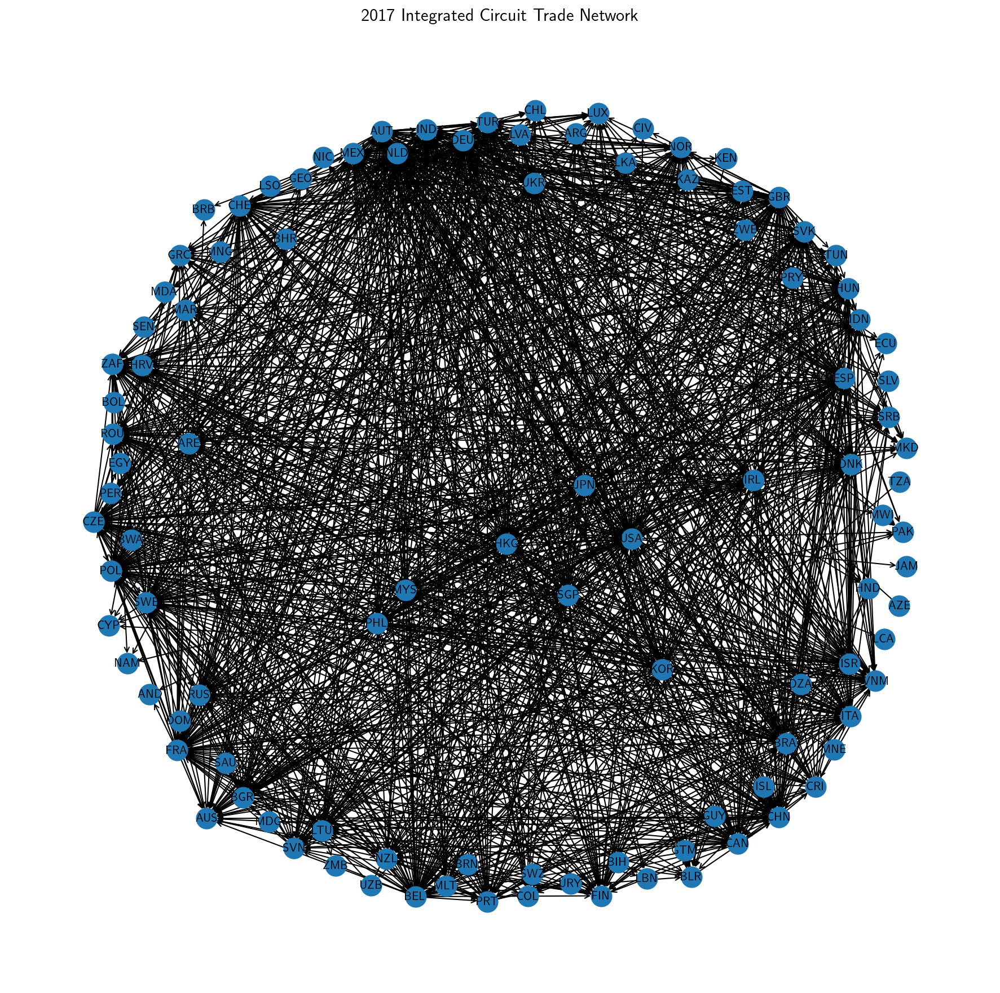

In [12]:
for year in years:
    # Initialize graph. Use force-directed layout
    fig, ax = plt.subplots(figsize = (15, 15))
    pos = nx.layout.spring_layout(all_graphs[year], k = 1600, iterations = 50)
       
    # Draw nodes, edges and labels
    nodes = nx.draw_networkx_nodes(all_graphs[year], pos, nodelist = all_graphs[year].nodes(), nodesize = 1000)
    edges = nx.draw_networkx_edges(all_graphs[year], pos, edgelist = all_graphs[year].edges(), arrowstyle = '->', arrowsize = 10, width = 1)
    nx.draw_networkx_labels(all_graphs[year], pos, font_size = 10, ax = ax)
    
    # Configure graph
    ax.set_title(str(year) + " Integrated Circuit Trade Network", fontdict = {'fontsize': 15})
    ax.set_axis_off()

## 3. Network Characterization

### 3.1 Link Density and Total Link Weight

The link density $\eta$ of the graph quantifies how well-connected (or how "complete", in graph-theoretic terms) a graph is. To determine this, we divide the total number of edges in the graph to the total number of possible edges between nodes. In a directed graph, this is given by
$$\eta = \frac{E}{N(N-1)}$$
where $E$ is the number of edges and $N$ is the number of nodes. Simply put, the link density is the fraction of connected links in comparison to a network which is fully-connected (i.e., all nodes are connected). 

Coupled with this, we can also look at the total link weight per year, as in Burkholz & Schweitzer (2019). The link density tells us how many links there are in the network at any point in time while the total link weight per year tells us the trade volume that goes on in the network at any point in time.

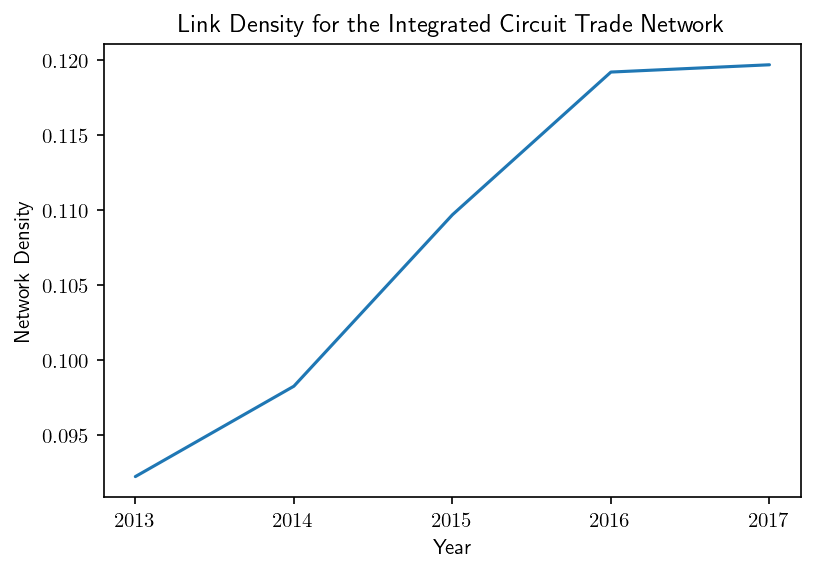

In [15]:
# Create list of network density per year.
density_list = [nx.density(all_graphs[year]) for year in years]

# Plot graph
fig, ax = plt.subplots()
sns.set(style = "dark")
ax.plot(years, density_list)
ax.set_title("Link Density for the Integrated Circuit Trade Network")
ax.set_xlabel("Year")
ax.set_ylabel("Network Density")
ax.locator_params(integer = True)

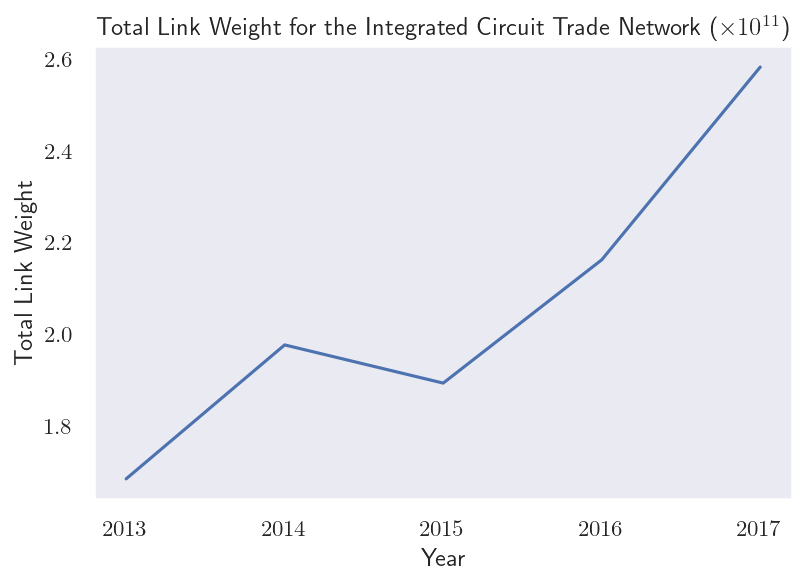

In [16]:
# Create list of network density per year.
tot_weight_list = [all_graphs[year].size(weight = "weight") for year in years]

# Plot graph
fig, ax = plt.subplots()
sns.set(style = "dark")
ax.plot(years, tot_weight_list)
ax.set_title("Total Link Weight for the Integrated Circuit Trade Network ($\\times 10^{11}$)")
ax.set_xlabel("Year")
ax.set_ylabel("Total Link Weight")
ax.locator_params(integer = True)
ax.yaxis.get_offset_text().set_visible(False)

The results show that both the density of the trade network and the total link weight have had a generally increasing trend throughout the years. Countries have been trading more frequently and in larger quantities with each other in the integrated circuit network, presumably as a result of globalization.

### 3.2 Degree Assortativity

The assortativity coefficient refers to the Pearson correlation of the degrees of two linked nodes. A positive value indicates a correlation between nodes of the same degree whereas a negative value indicates a correlation between nodes of different degrees. That is, a positive value signifies that nodes of similar degrees tend to associate with each other while a negative value signifies that high-degree nodes and low-degree nodes tend to associate with each other. As such, we expect to see low values for the assortativity coefficient as there does not seem to be any preferential attachment among high-degree or low-degree nodes in the network.

Assortativity has also been used to indicate whether or not a network has a core-periphery structure. A core-periphery struture is one characterized by a core of high-degree nodes surrounded by a periphery of lower-degree nodes. Assortative networks (i.e., networks for which the assortativity coefficient is positive) are said to be indicative of this type of structure. Given what we have observed in the graphs, we expect to observe an assortative structure in the input-output network.

Mathematically, the assortativity coefficient is given by:
$$ r = \frac{\sum_{ij}ij(e_{ij}-q_{i}q_{j})}{\sigma^{2}_{q}} $$
where $e_{ij}$ is the joint probability distribution of the remaining degree of the two nodes $j$ and $k$ (i.e., the distribution of their degrees if we exclude the link between the two nodes) and $q_{i}$ and $q_{j}$ refer to the probability distribution of the remaining degree of the two nodes.

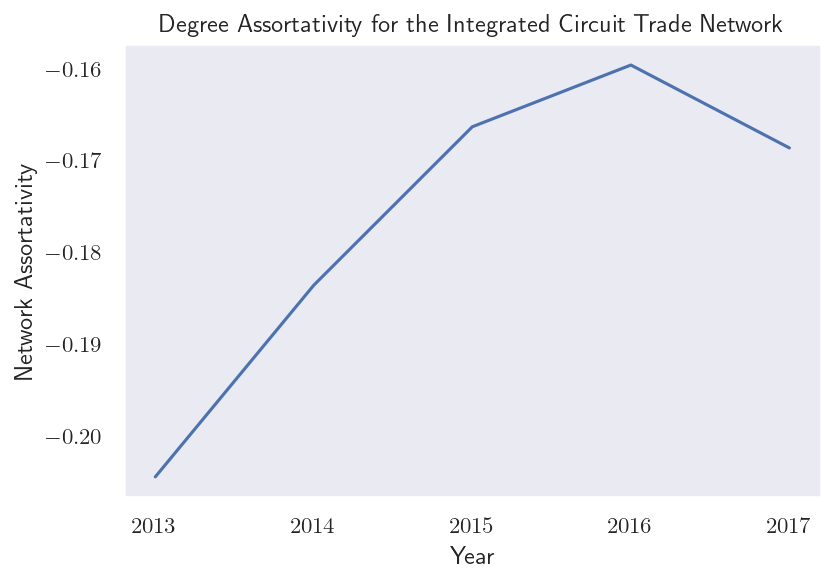

In [17]:
# Create list of network assortativity per year
assortativity_list = []
for year in years:
    graphs = all_graphs[year]
    assortativity_list.append(nx.degree_assortativity_coefficient(graphs))
    
# Plot histogram
fig, ax = plt.subplots()
sns.set(style = "dark")
ax.plot(years, assortativity_list)
ax.set_title("Degree Assortativity for the Integrated Circuit Trade Network")
ax.set_xlabel("Year")
ax.set_ylabel("Network Assortativity")
ax.locator_params(integer = True)

The assortativity values for the integrated circuit trade network are slightly negative, suggesting that the network is quite disassortative. This means that high-degree/low-degree countries in the network do not exhibit preferential attachment and prefer to trade with each other. This could also mean that the relatively poorly connected countries predominantly use highly-connected countries as trade hubs to access the rest of the network (Fagiolo, Reyes & Schiavo, 2008). 

The assortativity coefficient has been increasing over the years, however, which can potentially be attributed to high-degree countries forming more links with each other. As we'll see later, China/Taiwan and South Korea have been attributed to a number of high-value links with a number of countries. This can partly explain the general upward trend in assortativity. This will also explain the formation of a core-periphery structure, which we'll outline in the results of the simulation.

### 3.3 Centrality

We then compute for the centrality of the nodes. In this case, we will be computing the following: (1) in-degree and out-degree centrality, (2) in-strength and out-strength centrality, (3) betweenness centrality and (4) in-eigenvector and out-eigenvector centrality. The definitions for measures (1), (2) and (4) are taken from the De Benedictis, Nenci et al. (2013) paper.

#### 3.3.1 Degree Centrality 

We first check the degree, in-degree and out-degree of each node. The degree is the number of edges adjacent to the node. In particular, the in-degree refers to the number of edges pointing towards the node while the out-degree refers to the number of edges pointing away from the node.

In [18]:
# Create in-degree and out-degree dictionaries for each year
all_in_degrees = {}
all_out_degrees = {}

for year in years:
    all_in_degrees[year] = dict(all_graphs[year].in_degree)
    all_out_degrees[year] = dict(all_graphs[year].out_degree)

To determine how the in-degree and out-degree centralities vary per year for every country, we make use of a chloropleth map.

After installing GeoPandas, the following procedures may or may not be necessary to ensure that the code snippet below runs smoothly:
- Install pysal from the command line by typing `pip install pysal`. 

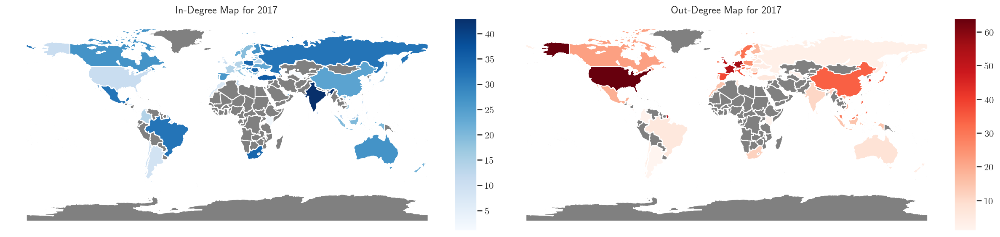

In [19]:
for year in [2017]:
    # Convert dictionaries to dataframes
    in_degree_df = pd.DataFrame.from_dict(all_in_degrees[year], orient = "index")
    in_degree_df.rename(columns = {0: "in-degree"}, inplace = True)

    out_degree_df = pd.DataFrame.from_dict(all_out_degrees[year], orient = "index")
    out_degree_df.rename(columns = {0: "out-degree"}, inplace = True)
    
    # Reset index
    in_degree_df.reset_index(inplace = True)
    in_degree_df.rename(columns = {"index": "Country Code"}, inplace = True)

    out_degree_df.reset_index(inplace = True)
    out_degree_df.rename(columns = {"index": "Country Code"}, inplace = True)

    # Merge
    degree_df = in_degree_df.merge(out_degree_df, left_on = "Country Code", right_on = "Country Code")

    # Merge with geodataframe
    degree_map = gdf.merge(degree_df, how = "left", left_on = "ADM0_A3", right_on = "Country Code")

    # Plot gray map
    fig, (ax_in, ax_out) = plt.subplots(1, 2, figsize = (16, 20))
    degree_map.plot(color = "gray", ax = ax_in)
    degree_map.plot(color = "gray", ax = ax_out)
    
    # Remove rows for which in-degree = 0 or out-degree = 0
    degree_map = degree_map[(degree_map["in-degree"] != 0) & (degree_map["out-degree"] != 0)]
    
    # Legend axis
    divider_in = make_axes_locatable(ax_in)
    cax_in = divider_in.append_axes("right", size = "5%", pad = 0.1)
    divider_out = make_axes_locatable(ax_out)
    cax_out = divider_out.append_axes("right", size = "5%", pad = 0.1)
    
    # Plot chloropleth layer
    degree_map.dropna().plot(column = "in-degree", cmap = "Blues", ax = ax_in, legend = True, cax = cax_in)
    ax_in.set_title("In-Degree Map for " + str(year))
    ax_in.set_axis_off()
    
    degree_map.dropna().plot(column = "out-degree", cmap = "Reds", ax = ax_out, legend = True, cax = cax_out)
    ax_out.set_title("Out-Degree Map for " + str(year))
    ax_out.set_axis_off()
    
    fig.tight_layout()

The maps show that countries like India, Brazil, Spain, Turkey, Romania, Mexico, South Africa and Russia have high in-degrees. On the other hand, countries like the US, France, Germany, the UK and South Korea have high out-
degrees.

Note that most of the countries in the East and Southeast Asian, Western European and North American regions seem to exhibit moderate to high in-degrees and out-degrees, potentially denoting the regions’ midstreamness in the integrated circuit value chain overall. The Philippines, in particular, has consistently had a higher out-degree
than in-degree, which makes sense as integrated circuits are one of its primary exports.

After getting the degree centralities for each country in the trade network for each year, we obtain the degree centrality distributions. For simplicity, we plot the histograms for the in-degree and out-degree centrality distributions for the year 2017.

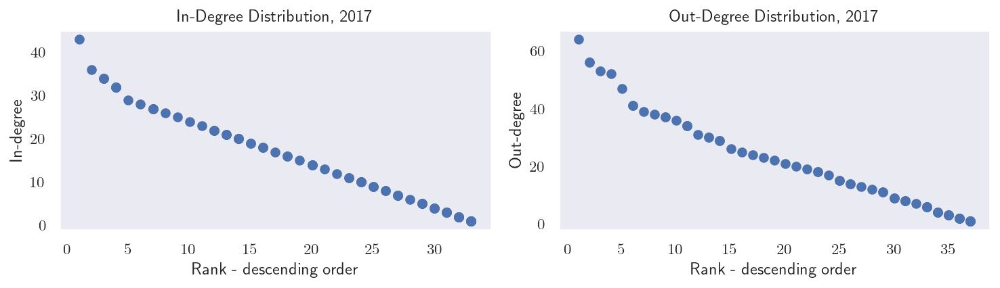

In [20]:
# Plot distribution of in-degrees
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (10, 3))

# Construct list of y-values. Remove 0's in the list
y_list = sorted(all_in_degrees[2017].values(), reverse = True)
y_list = np.array([i for i in y_list if i != 0])

# Construct list of x-values
x_list = stats.rankdata(np.negative(y_list), method = "dense")

ax1.scatter(x_list, y_list)
ax1.set_title("In-Degree Distribution, 2017")
ax1.set_xlabel("Rank - descending order")
ax1.set_ylabel("In-degree")

# Construct list of y-values. Remove 0's in the list
y_list = sorted(all_out_degrees[2017].values(), reverse = True)
y_list = np.array([i for i in y_list if i != 0])

# Construct list of x-values
x_list = stats.rankdata(np.negative(y_list), method = "dense")

ax2.scatter(x_list, y_list)
ax2.set_title("Out-Degree Distribution, 2017")
ax2.set_xlabel("Rank - descending order")
ax2.set_ylabel("Out-degree")

fig.tight_layout()

Note that both the in-degree and out-degree vary linearly with the rank. There are no apparent outliers in the network in terms of degree.

Lastly, we get the top 10 countries in terms of in-degree and out-degree centrality for the year 2017.

In [21]:
degree_df.sort_values(by = ["in-degree"], ascending = False).head(10)

,Country Code,in-degree,out-degree
83,IND,43,11
90,TUR,36,6
15,ZAF,34,12
29,ROU,34,8
58,POL,34,25
2,BRA,32,6
70,MEX,32,19
79,HUN,32,21
11,RUS,32,3
94,SVK,29,14


In [22]:
degree_df.sort_values(by = ["out-degree"], ascending = False).head(10)

,Country Code,in-degree,out-degree
8,USA,11,64
34,NLD,17,56
43,DEU,14,56
12,FRA,14,53
81,GBR,10,52
96,BEL,9,47
46,KOR,10,41
36,SGP,16,41
87,ISR,7,39
42,ESP,26,38


These show that that India has the highest in-degree, signifying that it has the highest number of import partners in 2017. Meanwhile, the US has the highest out-degree, signifying that it has the highest number of export partners.

#### 3.4.2 Strength Centrality

The degree centrality quantifies how central a node is in terms of the number of nodes it shares an edge with. This can be decomposed further into in-degree centrality (based on the number of nodes connected to it) and out-degree centrality (based on the number of nodes a node connects to).

We can weight each connection by the edge weight, however, resulting in the in-strength and out-strength centrality measures. In particular, the normalized versions of these measures are given by
$$ C_{S_{out}} = \frac{\sum_{j \neq i}^{N}W_{ij}}{\sum_{i}\sum_{j}W_{ij}} $$
$$ C_{S_{in}} = \frac{\sum_{j \neq i}^{N}W_{ji}}{\sum_{i}\sum_{j}W_{ij}} $$

Since NetworkX does not use this formula in its computation of the strength centrality, we compute it ourselves with the code snippet below. We compute these values for all countries and for all years. We also compute for the average trade per year, to be used in another computation. 

In [23]:
# Create in-strength and out-strength dictionary
all_in_strengths = {}
all_out_strengths = {}
average_trade = {}

for year in years:
    all_in_strengths[year] = {}
    all_out_strengths[year] = {}
    average_trade[year] = {}
    
    for country in all_countries[year]:
        all_in_strengths[year][country] = 0
        all_out_strengths[year][country] = 0
        average_trade[year][country] = 0

for year in years:
    links = all_links[year]
    countries = all_countries[year]
    weight_total = 0
    
    # Fill in values
    for link in links:
        source = link[0]
        target = link[1]
        weight = link[2]
        
        all_in_strengths[year][target] += float(weight)
        all_out_strengths[year][source] += float(weight)
        weight_total += float(weight)
    
    average_trade[year] = weight_total / len(countries)
    
    # Normalize
    for country in countries:
        all_in_strengths[year][country] /= weight_total
        all_out_strengths[year][country] /= weight_total

To determine how the in-strength and out-strength centralities vary per year for every country, we make use of a chloropleth map.

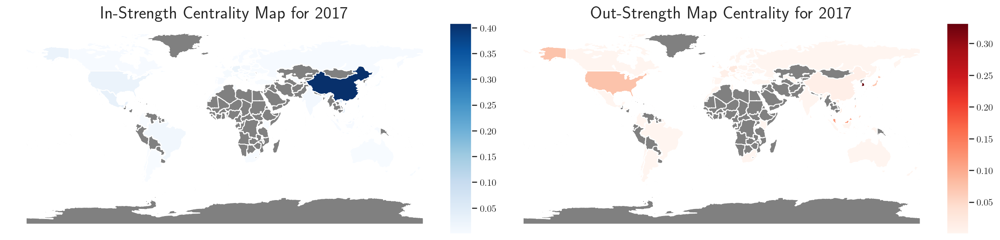

In [24]:
for year in [2017]:
    in_strength_df = pd.DataFrame.from_dict(all_in_strengths[year], orient = "index")
    in_strength_df.rename(columns = {0: "in-strength"}, inplace = True)

    out_strength_df = pd.DataFrame.from_dict(all_out_strengths[year], orient = "index")
    out_strength_df.rename(columns = {0: "out-strength"}, inplace = True)
    
    # Reset index
    in_strength_df.reset_index(inplace = True)
    in_strength_df.rename(columns = {"index": "Country Code"}, inplace = True)

    out_strength_df.reset_index(inplace = True)
    out_strength_df.rename(columns = {"index": "Country Code"}, inplace = True)
    
    # Merge
    strength_df = in_strength_df.merge(out_strength_df, left_on = "Country Code", right_on = "Country Code")
    
    # Merge with geodataframe
    strength_map = gdf.merge(strength_df, how = "left", left_on = "ADM0_A3", right_on = "Country Code")
    
    # Plot gray map
    fig, (ax_in, ax_out) = plt.subplots(1, 2, figsize = (16, 20))
    strength_map.plot(color = "gray", figsize = (15, 20), ax = ax_in)
    strength_map.plot(color = "gray", figsize = (15, 20), ax = ax_out)
    
    # Remove rows for which in-degree = 0 or out-degree = 0
    strength_map = strength_map[(strength_map["in-strength"] != 0) & (strength_map["out-strength"] != 0)]
    
    # Legend axis
    divider_in = make_axes_locatable(ax_in)
    cax_in = divider_in.append_axes("right", size = "5%", pad = 0.1)
    divider_out = make_axes_locatable(ax_out)
    cax_out = divider_out.append_axes("right", size = "5%", pad = 0.1)
    
    # Plot chloropleth layer
    strength_map.dropna().plot(column = "in-strength", cmap = "Blues", legend = True, ax = ax_in, cax = cax_in)
    ax_in.set_title("In-Strength Centrality Map for " + str(year), fontdict = {'fontsize': 20})
    ax_in.set_axis_off()
    
    strength_map.dropna().plot(column = "out-strength", cmap = "Reds", legend = True, ax = ax_out, cax = cax_out)
    ax_out.set_title("Out-Strength Map Centrality for " + str(year), fontdict = {'fontsize': 20})
    ax_out.set_axis_off()
    
    fig.tight_layout()

The strength centrality differs from degree centrality in that it takes the weight of the links into account. Having done so, we can see that while China has not had the most export partners in any year, it is absolutely dominant in terms of in-strength centrality for all five years considered.

China also ranks much higher in terms of in-strength centrality as opposed to out-strength centrality. Meanwhile, in terms of degree centrality (both in-degree and out-degree), it has consistently ranked mid-table. This means that it has China has a number of IC import partners with which it has a very large trade volume.

On the other hand, South Korea has consistently ranked first in the IC network in terms of out-strength centrality, this despite the fact that South Korea has never had the most import partners in any year. Again, this may be because it has a number of IC export partners with which it has a very large trade volume. Aside from South Korea, there are also a number of countries which can be regarded as important outgoing trade hubs in the IC trade network such as the US, Malaysia, Singapore, the Philippines and Japan.

After getting the strength centralities for each country in the trade network for each year, we obtain the strength centrality distributions. For simplicity, we plot the histograms for the in-strength and out-strength centrality distributions for the year 2017.

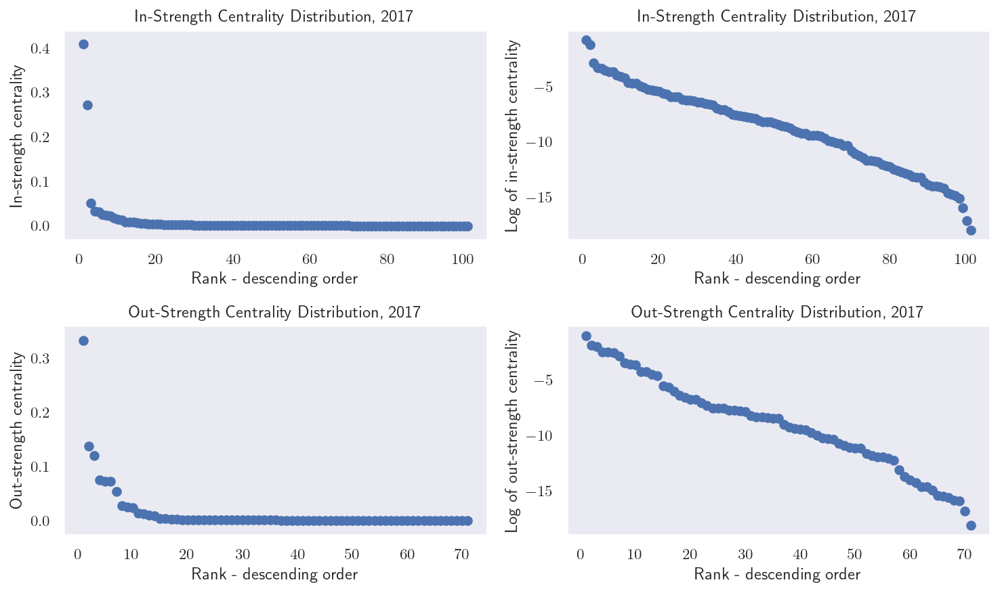

In [25]:
# Plot distribution of in-strength centrality
fig, ax = plt.subplots(2, 2, figsize = (10, 6))

# Construct list of y-values. Remove 0's in the list
y_list = sorted(all_in_strengths[2017].values(), reverse = True)
y_list = np.array([i for i in y_list if i != 0])

# Construct list of x-values
x_list = stats.rankdata(np.negative(y_list), method = "dense")

ax[0, 0].scatter(x_list, y_list)
ax[0, 0].set_title("In-Strength Centrality Distribution, 2017")
ax[0, 0].set_xlabel("Rank - descending order")
ax[0, 0].set_ylabel("In-strength centrality")

ax[0, 1].scatter(x_list, np.log(y_list))
ax[0, 1].set_title("In-Strength Centrality Distribution, 2017")
ax[0, 1].set_xlabel("Rank - descending order")
ax[0, 1].set_ylabel("Log of in-strength centrality")

# Construct list of y-values. Remove 0's in the list
y_list = sorted(all_out_strengths[2017].values(), reverse = True)
y_list = np.array([i for i in y_list if i != 0])

# Construct list of x-values
x_list = stats.rankdata(np.negative(y_list), method = "dense")

ax[1, 0].scatter(x_list, y_list)
ax[1, 0].set_title("Out-Strength Centrality Distribution, 2017")
ax[1, 0].set_xlabel("Rank - descending order")
ax[1, 0].set_ylabel("Out-strength centrality")

ax[1, 1].scatter(x_list, np.log(y_list))
ax[1, 1].set_title("Out-Strength Centrality Distribution, 2017")
ax[1, 1].set_xlabel("Rank - descending order")
ax[1, 1].set_ylabel("Log of out-strength centrality")

fig.tight_layout()

From the linear plots, we see that there are very obvious outliers when we consider the link weights in the computation of the centrality. This stands in contrast with the distribution of the degree centrality, which is roughly uniform in spread. This signifies that the distribution is very heavily right-skewed, suggesting the presence of only a few incoming and outgoing hubs in the trade network which export/import a considerable amount of ICs (potentially forming the core of the network). The semilog plots, on the other hand, are roughly linear, suggesting that the rank is related to the in-strength and out-strength through an exponential function.

Lastly, we get the top 10 countries in terms of in-strength and out-strength centrality for the year 2017.

In [26]:
strength_df.sort_values(by = ["in-strength"], ascending = False).head(10)

,Country Code,in-strength,out-strength
69,CHN,0.4084433901,0.0127855938
17,HKG,0.2712190336,0.0722158284
28,VNM,0.0504830260,0.0229935593
36,SGP,0.0323640950,0.1375397362
70,MEX,0.0314456528,0.0002374947
8,USA,0.0251035442,0.0743141925
43,DEU,0.0234046785,0.0244284761
34,NLD,0.0225012189,0.0124176313
74,PHL,0.0172273035,0.0528225342
46,KOR,0.0148916951,0.3318328315


In [27]:
strength_df.sort_values(by = ["out-strength"], ascending = False).head(10)

,Country Code,in-strength,out-strength
46,KOR,0.0148916951,0.3318328315
36,SGP,0.0323640950,0.1375397362
44,MYS,0.0080399371,0.1201234095
8,USA,0.0251035442,0.0743141925
78,JPN,0.0046065707,0.0724459271
17,HKG,0.2712190336,0.0722158284
74,PHL,0.0172273035,0.0528225342
25,IRL,0.0003513166,0.0274227280
43,DEU,0.0234046785,0.0244284761
28,VNM,0.0504830260,0.0229935593


We see that for the most part, China has the highest in-strength centrality, while South Korea has the highest out-strength centrality. For 2017, the centrality figures for China and South Korea suggest that on average, the former has a 40.84% market share over total imports while the latter has a 33.18% market share over total exports.

The Philippines seems to have around the same figures throughout the years for both in-strength and out-strength centrality, possibly suggesting that it mostly imports raw materials/intermediate inputs and exports intermediate inputs/final products. In general, the presence of many East Asian/Southeast Asian countries in the top 10 suggests the regions' importance as trade hubs in the IC trade network.

#### 3.4.3 (Weighted) Betweenness Centrality

The betweenness centrality is based on shortest paths, or geodesics. It quantifies how many of the geodesics between any two nodes in a network pass through a given node. Given nodes $s$ and $t$, the betweenness centrality of the node $v$ is given by

$$g(v) = \sum_{s \neq v \neq t} \frac{\sigma_{st}(v)}{\sigma_{st}}$$

where $\sigma_{st}$ is the total number of geodesics from $s$ to $t$ and $\sigma_{st}(v)$ is the number of such paths that pass through $v$. As such, it quantifies how many geodesics pass through a node $v$ for all pairs of nodes $s$ and $t$ in the network; that is, how "in between" node $v$ is in a given network. Thus, we expect central nodes to lie in the geodesics of many pairs of nodes.

However, we need to modify the conventional definition slightly for trade networks. Normally, links in a trade network are weighted by the trade volume. This means, however, that in computing for the geodesic, the shortest path algorithm (Dijkstra's algorithm, in this case) prioritizes low-volume links instead of high-volume ones. In this case, however, edges with greater weights should carry more importance. Thus, following the De Benedictis, Nenci et al. (2013) paper, we define the measure $\omega_{ij}$ defined as
$$\omega_{ij} = \frac{W_{ij}}{\frac{\sum_{i}\sum_{j}W_{ij}}{N}}$$
which is the reciprocal of the share of the trade volume between countries $i$ and $j$ in the average bilateral trade volume. We define a new graph similar to the one we previously constructed but replace the weights by $\omega_{ij}$. As such, when we implement a Dijkstra's algorithm, it minimizes the sum of $\omega_{ij}$, in turn maximizing $W_{ij}$, as intended.

Dijkstra's algorithm would get the shortest path $I_{ij}$ such that
$$I_{ij} = \min\left(\frac{1}{\omega_{iz_{1}}} + \frac{1}{\omega_{iz_{2}}} + ...\right)$$
where $z_{1}$, $z_{2}$, ... are intermediate steps between $i$ and $j$. 

For this centrality measure, there is no need  to distinguish between in- and out-betweenness (The node is in between two other nodes, so it receives but also gives at the same time). As such, we can safely use the default `nx.betweenness` function. To get the inverse of the weights/trade volumes, we use `years_graph_inv` instead of `years_graph`, using the `weight` argument in `nx.betweenness` to account for the weights in the graphs. 

In the NetworkX implementation, the betweenness centralities are normalized and divided by the maximum possible betweenness centrality $(n-1)(n-2)$.

We first construct the graph with the weights $\omega_{ij}$.

In [28]:
# Create copy of original trade network links
import copy

all_links_inv = copy.deepcopy(all_links)

# Modify weights
for year in years:
    links = all_links_inv[year]
    
    for link in links:
        if link[2] != 0:
            link[2] = average_trade[year] / float(link[2])

In [29]:
# Create mapping from year to graph
all_graphs_inv = {}

for year in years:
    all_graphs_inv[year] = nx.DiGraph()

# Create nodes
for year in years:
    all_graphs_inv[year].add_nodes_from(all_countries[year])

# Create edges
for year in years:
    all_graphs_inv[year].add_weighted_edges_from(all_links_inv[year])

After creating the graphs, we now compute the betwenness centrality.

In [30]:
# Create betweenness centrality dictionary for each year
all_betweenness = {}

for year in years:
    graphs = all_graphs_inv[year]
    
    all_betweenness[year] = dict(nx.betweenness_centrality(graphs, weight = "weight"))

To determine how the (weighted) betweenness centrality varies per year for every country, we make use of a chloropleth map.

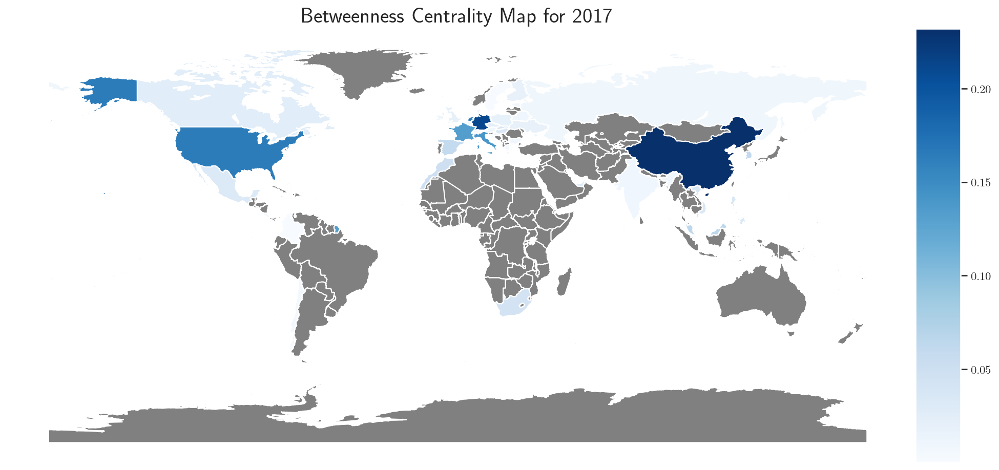

In [31]:
for year in [2017]:
    # Convert dictionaries to dataframes
    betweenness_df = pd.DataFrame.from_dict(all_betweenness[year], orient = "index")
    betweenness_df.rename(columns = {0: "betweenness"}, inplace = True)
    
    # Reset index
    betweenness_df.reset_index(inplace = True)
    betweenness_df.rename(columns = {"index": "Country Code"}, inplace = True)
    
    # Merge with geodataframe
    betweenness_map = gdf.merge(betweenness_df, how = "left", left_on = "ADM0_A3", right_on = "Country Code")
    
    # Plot gray map
    ax = betweenness_map.plot(color = "gray", figsize = (16, 20))
    
    # Remove rows for which betweenness = 0 or weighted betweenness = 0
    betweenness_map = betweenness_map[betweenness_map["betweenness"] != 0]
    
    # Legend axis
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size = "5%", pad = 0.1)
    
    # Plot chloropleth layer
    betweenness_map.dropna().plot(column = "betweenness", cmap = "Blues", legend = True, ax = ax, cax = cax)
    ax.set_title("Betweenness Centrality Map for " + str(year), fontdict = {'fontsize': 20})
    ax.set_axis_off()

From the maps, we see the usual suspects having the highest weighted betweenness centrality in the IC network: Germany (DEU), France (FRA), China (CHN), Vietnam (VNM), Singapore (SGP), Malaysia (MYS), the US (USA), South Africa (ZAF) and very recently, Italy (ITA). This means that these countries have a significant midstream presence in the IC value chain.

After getting the betweenness centrality for each country in the trade network for each year, we obtain the betweenness centrality distribution. For simplicity, we plot the histograms for the betweenness distribution for the year 2017.

Text(0, 0.5, 'Log of betweenness centrality')

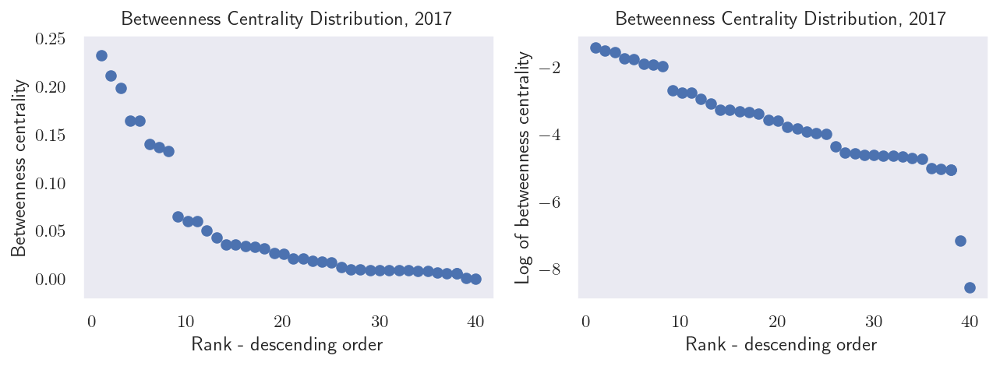

In [32]:
# Plot distribution of betweenness centrality
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (10, 3))

# Construct list of y-values. Remove 0's in the list
y_list = sorted(all_betweenness[2017].values(), reverse = True)
y_list = np.array([i for i in y_list if i != 0])

# Construct list of x-values
x_list = stats.rankdata(np.negative(y_list), method = "dense")

ax1.scatter(x_list, y_list)
ax1.set_title("Betweenness Centrality Distribution, 2017")
ax1.set_xlabel("Rank - descending order")
ax1.set_ylabel("Betweenness centrality")

# Construct list of y-values. Remove 0's in the list
y_list = sorted(all_betweenness[2017].values(), reverse = True)
y_list = np.array([i for i in y_list if i != 0])

# Construct list of x-values
x_list = stats.rankdata(np.negative(y_list), method = "dense")

ax2.scatter(x_list, np.log(y_list))
ax2.set_title("Betweenness Centrality Distribution, 2017")
ax2.set_xlabel("Rank - descending order")
ax2.set_ylabel("Log of betweenness centrality")

From the distribution of the betweenness centrality, one can determine the presence of outlying nodes. As with before, this suggests the presence of trade hubs in the network -- some of which are probably taking in or receiving a large amount of trade. 

As with before, the semilog plots are roughly linear in shape, meaning that the rank and the betweenness centrality are related through an exponential function.

Lastly, we get the top 10 countries in terms of betweenness centrality for the year 2017.

In [33]:
betweenness_df.sort_values(by = ["betweenness"], ascending = False).head(10)

,Country Code,betweenness
69,CHN,0.2321695295
43,DEU,0.2115384615
36,SGP,0.1979088872
8,USA,0.1646751307
34,NLD,0.1641150112
23,ITA,0.1397498133
17,HKG,0.1365758028
12,FRA,0.1331217326
44,MYS,0.0646938013
46,KOR,0.0601194922


Unsurprisingly, China is the most in-between country in the IC trade network in terms of weighted betweenness centrality, with 23.22% of all inter-country geodesics passing through it at some point, after accounting for trade volume. This means that most high-value IC trade links are more likely to pass through China than through every other country. The list also contains the other countries we had identified earlier, including some countries in the East Asian/Southeast Asian region and the Western European region.

#### 3.4.4 (Weighted) Eigenvector Centrality

As opposed to the other three centrality measures, eigenvector centrality is often used as a measure of influence/prestige. Eigenvector centrality accounts for a node's neighbors and how well-connected they are. Thus, the higher the eigenvector centrality of a node, the more well-connected its neighbors are.

The computation of the eigenvector centrality is fairly involved but the mechanics of such a computation are explained in the Review of Related Literature. NetworkX computes for the in-eigenvector by default through the `nx.eigenvector_centrality_numpy` function, with the argument `weight` for the edge weights. De Benedictis, Nenci et al. (2013) discuss that computing for the left leading eigenvector (out-eigenvector) is simply a matter of reversing all the directions in the directed graph. Thus, we reverse the directions in any directed graph by using the `graph.reverse` function and compute the out-eigenvector from the reversed graph.

Both calculations are done in the code snippet below.

In [34]:
# Create eigenvector centrality dictionary for each year
all_in_eigenvector = {}
all_out_eigenvector = {}

for year in years:
    graphs = all_graphs[year]
    reverse_graphs = all_graphs[year].reverse()
    
    all_in_eigenvector[year] = dict(nx.eigenvector_centrality_numpy(graphs, weight = "weight"))
    all_out_eigenvector[year] = dict(nx.eigenvector_centrality_numpy(reverse_graphs, weight = "weight"))

To determine how the (weighted) eigenvector centrality varies per year for every country, we make use of a chloropleth map.

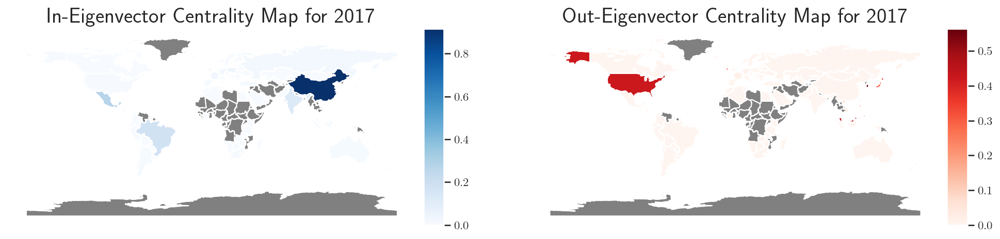

In [35]:
for year in [2017]:
    # Convert dictionaries to dataframes
    in_eigenvector_df = pd.DataFrame.from_dict(all_in_eigenvector[year], orient = "index")
    in_eigenvector_df.rename(columns = {0: "in-eigenvector"}, inplace = True)
    in_eigenvector_df[in_eigenvector_df["in-eigenvector"] < 0] = 0

    out_eigenvector_df = pd.DataFrame.from_dict(all_out_eigenvector[year], orient = "index")
    out_eigenvector_df.rename(columns = {0: "out-eigenvector"}, inplace = True)
    out_eigenvector_df[out_eigenvector_df["out-eigenvector"] < 0] = 0

    # Reset index
    in_eigenvector_df.reset_index(inplace = True)
    in_eigenvector_df.rename(columns = {"index": "Country Code"}, inplace = True)
    
    out_eigenvector_df.reset_index(inplace = True)
    out_eigenvector_df.rename(columns = {"index": "Country Code"}, inplace = True)
    
    # Merge
    eigenvector_df = in_eigenvector_df.merge(out_eigenvector_df, left_on = "Country Code", right_on = "Country Code")

    # Merge with geodataframe
    eigenvector_map = gdf.merge(eigenvector_df, how = "left", left_on = "ADM0_A3", right_on = "Country Code")
    
    # Plot gray map
    fig, (ax_in, ax_out) = plt.subplots(1, 2, figsize = (16, 20))
    eigenvector_map.plot(color = "gray", ax = ax_in)
    eigenvector_map.plot(color = "gray", ax = ax_out)
    
    # Legend axis
    divider_in = make_axes_locatable(ax_in)
    cax_in = divider_in.append_axes("right", size = "5%", pad = 0.1)
    divider_out = make_axes_locatable(ax_out)
    cax_out = divider_out.append_axes("right", size = "5%", pad = 0.1)
    
    # Plot chloropleth layer
    eigenvector_map.dropna().plot(column = "in-eigenvector", cmap = "Blues", legend = True, ax = ax_in, cax = cax_in)
    ax_in.set_title("In-Eigenvector Centrality Map for " + str(year), fontdict = {'fontsize': 20})
    ax_in.set_axis_off()

    eigenvector_map.dropna().plot(column = "out-eigenvector", cmap = "Reds", legend = True, ax = ax_out, cax = cax_out)
    ax_out.set_title("Out-Eigenvector Centrality Map for " + str(year), fontdict = {'fontsize': 20})
    ax_out.set_axis_off()

As opposed to the other three centrality measures, the eigenvector centrality also takes into account the centralities of its neighbors. As such, it is often used as a measure of influence/prestige.

Looking at the maps, we again see that China has a significantly higher weighted in-eigenvector centrality than the rest of the countries, for reasons we have already outlined in the previous sections.

More interestingly, aside from South Korea, the US and many other countries in the East Asian/Southeast Asian regions (including Japan, Malaysia, Singapore and the Philippines) have higher weighted out-eigenvector centralities than average. These are again for reasons that have already been outlined in the previous sections.

After getting the eigenvector centrality for each country in the trade network for each year, we obtain the eigenvector centrality distributions. For simplicity, we plot the histograms for the in-eigenvector and out-eigenvector centrality distributions for the year 2017.

C:\Users\JM\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in log
  app.launch_new_instance()
C:\Users\JM\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in log


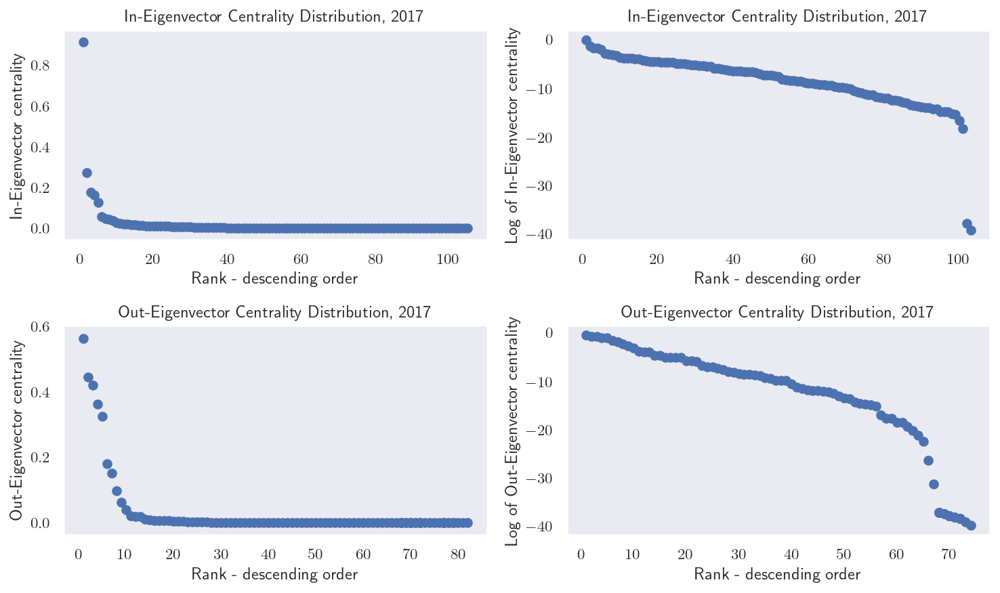

In [36]:
# Plot distribution of in-eigenvector centrality
fig, ax = plt.subplots(2, 2, figsize = (10, 6))

# Construct list of y-values. Remove 0's in the list
y_list = sorted(all_in_eigenvector[2017].values(), reverse = True)
y_list = np.array([i for i in y_list if i != 0])

# Construct list of x-values
x_list = stats.rankdata(np.negative(y_list), method = "dense")

ax[0, 0].scatter(x_list, y_list)
ax[0, 0].set_title("In-Eigenvector Centrality Distribution, 2017")
ax[0, 0].set_xlabel("Rank - descending order")
ax[0, 0].set_ylabel("In-Eigenvector centrality")

ax[0, 1].scatter(x_list, np.log(y_list))
ax[0, 1].set_title("In-Eigenvector Centrality Distribution, 2017")
ax[0, 1].set_xlabel("Rank - descending order")
ax[0, 1].set_ylabel("Log of In-Eigenvector centrality")

# Construct list of y-values. Remove 0's in the list
y_list = sorted(all_out_eigenvector[2017].values(), reverse = True)
y_list = np.array([i for i in y_list if i != 0])

# Construct list of x-values
x_list = stats.rankdata(np.negative(y_list), method = "dense")

ax[1, 0].scatter(x_list, y_list)
ax[1, 0].set_title("Out-Eigenvector Centrality Distribution, 2017")
ax[1, 0].set_xlabel("Rank - descending order")
ax[1, 0].set_ylabel("Out-Eigenvector centrality")

ax[1, 1].scatter(x_list, np.log(y_list))
ax[1, 1].set_title("Out-Eigenvector Centrality Distribution, 2017")
ax[1, 1].set_xlabel("Rank - descending order")
ax[1, 1].set_ylabel("Log of Out-Eigenvector centrality")

fig.tight_layout()

The outliers become much more apparent in the linear distributions for the eigenvector centralities, again signifying the presence of incoming and outgoing hubs in the trade network that take in/receive a large amount of trade.

As before, we find that the semi-log plots are linear, suggesting that eigenvector centrality and the rank are related by an exponential function. 

Lastly, we get the top 10 countries in terms of eigenvector centrality for the year 2017.

In [37]:
eigenvector_df.sort_values(by = ["in-eigenvector"], ascending = False).head(10)

,Country Code,in-eigenvector,out-eigenvector
69,CHN,0.9154936928,0.0010077183
70,MEX,0.2743264280,0.0000461993
2,BRA,0.1760544315,0.0000000005
17,HKG,0.1644362797,0.0056321268
83,IND,0.1279135329,0.0002044503
63,CZE,0.0564844672,0.0007902131
34,NLD,0.0469685404,0.0055840683
58,POL,0.0422577416,0.0000051828
12,FRA,0.0351331738,0.0172270625
79,HUN,0.0252086984,0.0000111750


In [38]:
eigenvector_df.sort_values(by = ["out-eigenvector"], ascending = False).head(10)

,Country Code,in-eigenvector,out-eigenvector
46,KOR,0.0055270566,0.5635134302
44,MYS,0.0053555561,0.4449848880
8,USA,0.0069703552,0.4208502627
25,IRL,0.0006078740,0.3615903970
78,JPN,0.0026165076,0.3245319830
36,SGP,0.0134810765,0.1807592182
74,PHL,0.0067986314,0.1499541853
28,VNM,0.0195421511,0.0973361937
87,ISR,0.0023038179,0.0621369646
23,ITA,0.0095871928,0.0382459701


The above show that China has the highest in-eigenvector centrality for 2017 while South Korea has the highest out-eigenvector centrality in the same year. This is roughly in line with our earlier results.

In general, a high in-eigenvector centrality suggests that a country's import partners are connected to many other countries which are, in turn, connected to many others. The same is true for the out-eigenvector centrality, except that it concerns a country's export partners.

Overall, based on the centrality measures we computed, we draw the following
conclusions:

- The results obtained from the degree centrality differs vastly from the results obtained when we consider trade volume (strength centrality), trade volume & extent of intermediation (betweenness centrality) and trade volume & importance of trade partners (eigenvector centrality). This is apparent in the rank-size distributions, where we can detect the presence of outliers for the latter three centralities.
- Nonetheless, there is no clear division in the rank-size distributions between core and peripheral nodes. This justifies the use of a distinguishing metric other than centralities to identify core nodes from peripheral ones.
- China and South Korea consistently have the highest incoming and outgoing weighted centralities, respectively.
- Based on the geographical profile of the top countries in terms of the weighted centralities, we can identify three main geographical trading blocs: (i) North America, (ii) Western Europe and (iii) East/Southeast Asia. Coincidentally, countries in these regions also have high betweenness centralities, indicating that these regions have a significant midstream presence in the IC trade network.
- Other notable countries outside these regions include Brazil, India, Poland and Hungary (in terms of in-eigenvector centrality) and Israel (in terms of out-eigenvector centrality).
- The Philippines has a significant midstream presence in the network. However, it is a much more prominent exporter than importer.

## 4. Cascading Failure-Based Simulation (Supply-Side Decrease)

### 4.1 Implementation

Having characterized the integrated circuit trade network, we can now proceed with performing simulations on it. This particular section is devoted to simulating a sudden supply-side decrease in one of the nodes in the IC network, implemented using a cascading failure-based model. The descriptions, assumptions and eventual implementation of this simulation will be as follows.  

#### 4.1.1 Description and Assumptions

The primary goal of this model is to determine how a decrease in one country's IC supply can potentially impact the other countries in the trade network. 

Being able to model these changes is especially important for the Philippines and the other countries in its immediate vicinity, which we have found to play an important role in the IC trade network overall. This is in light of many geopolitical changes which threaten to limit a country's ability to supply integrated circuits to its trading partners, from Japan restricting the trade of chemicals used in the manufacture of semiconductors to South Korea (Lee, 2019), China poaching chip engineers from Taiwan in its "Made in China 2025" project (Ihara, 2019) or the coronavirus outbreak in China potentially leading companies to outsource production to other countries (Quach, 2020).

The model is built based on trade networks which themselves are based on annual data regarding integrated circuit trade given by the United Nations' Comtrade database. In particular, we will be using their latest dataset (from 2017). As such, we cannot observe the reaction to supply-side shocks on a short time scale. Moreover, because the data is based on year-end reports, the shock is assumed to have occurred after the end of 2017. Trade shocks take some time to promulgate, however, and the trade network measures have been shown to be somewhat consistent from year to year, so these assumptions are not entirely unrealistic.

Our model is based on those of Burkholz & Schweitzer (2019) and Gephart et al. (2016). We begin with $n$ trading partners and an initial trade matrix $F^{0}$, based on the 2017 trade flows sourced from the UN Comtrade database. The trade matrix is structured such that the trade flow from country $i$ to country $j$ at time 0 is given by $F^{t}_ {ij}$. The total exports at time $t$ to country $k$, denoted by $e^{t}_{k}$ is given by the row sums; i.e., 

\begin{equation}
e^{t}_{k} = \sum_{l = 1}^{n}F^{t}_{kl}
\end{equation}

The total imports at time $t$ to country $k$, denoted by $i^{t}_{k}$ is given by the column sums; i.e., 

\begin{equation}
i^{t}_{k} = \sum_{j = 1}^{n}F^{t}_{jk}
\end{equation}

We then introduce a perturbation to the trade network by reducing the supply of some country $k$ at iteration $t = 1$. This creates a demand deficit for country $k$, which it compensates for by reducing its exports to its trading partners by a fraction $s$, where $0 < s \leq 1$ (the shock parameter). That is,

\begin{equation}
e^{1}_{j} = (1 - s)e^{0}_{j}
\end{equation}

while $e^{1}_{k} = e^{0}_{k}$ for all countries $k \neq j$.

We also assume that the reduction in supply is not fully compensated for, and that only a proportion $q$, where $0 < q \leq 1$ (the spread parameter) is transmitted. We let the matrix $E^{t}$ denote an export-only variant of the adjacency matrix for shocked nodes. That is, $E^{t}_{j, k} = 1$  if a trade link exists from shocked country j to country k (not from country k to country j) and 0 otherwise.

The shock given by $qse^{0}_{j}$ is transmitted to the export trading partners in accordance to the transfer matrix $T^{t}$. By default, we assume that the shocks are distributed proportionally, so that the elements of the transfer matrix at $t = 1$ are given by

\begin{equation}
T^{1}_{jk} = \frac{F^{0}_{jk}}{e^{0}_{j}}
\end{equation}

Thus, at $t = 1$, the trade matrix $F^{1}$ is given by

\begin{equation}
F^{1}_{jk} = F^{0}_{jk} - T^{1}_{jk} * E^{t}_{jk} \cdot qse^{0}_{j}
\end{equation}

where $*$ denotes element-wise multiplication and $\cdot$ denotes scalar multiplication.

We update the exports, imports and transfer matrices accordingly, with respect to the new trade matrix $F^{1}$.

The starting node's export partners now have their imports reduced. This creates a demand deficit in these countries and in compensation, they reduce their own exports to their export partners. This then creates a demand deficit, so that these export partners reduce their exports to their export partners.

This continues until a node is unable to pass the shock any further because its exports have been reduced to zero (or less than zero). We denote this iteration as $t^{eq}$.

Thus, we can iteratively define the dynamics as follows:

\begin{equation}
F^{t+1}_{jk} = F^{t}_{jk} - T^{t}_{jk} * E_{jk} \cdot qse^{t}_{j}
\end{equation}

Intrinsic to the model above are a number of assumptions. These include:
- The shocks are assumed to have occurred at the start of the year.
- The shocks are observed on an annual time scale.
- There are global parameters (shock parameter, spread parameter) which define the extent and spread of the shock, regardless of the starting node.
- Demand for integrated circuits in all countries is assumed to be fixed. Thus, in response to decreased supply, they reduce exports.
- The shocks are spread proportionally to a country's export partners.  
- The model reaches equilibrium when one of the nodes fails -- that is, if one of the nodes can no longer reduce its exports to compensate for the demand deficit. In truth, the other nodes can continue exporting, independent of any other nodes' failure.

Due to limitations in computing power, we impose the following additional assumptions:
- The shock and spread parameter can only take on values which are multiples of 0.1.

#### 4.1.2 Implementation

We now implement the model described in 4.1.1 in Python. We first create a dictionary which links the nodes to all their neighbors with respect to the out-edges. This is because the shock can only be transmitted to a node's import neighbors and not its export neighbors.

In [39]:
# Get neigbors with respect to out-edges of all nodes
def neighbor_out(graph):
    neighbor_dict = {}

    for node in list(graph.nodes):
        neighbor_list = []
        for source, target in list(graph.out_edges(node)):
            neighbor_list.append(target)
        neighbor_dict[node] = neighbor_list
    
    return neighbor_dict

We then create the function `sim_cascade_1` to run the simulation. The function has six arguments, namely:
- `graph`, which allows us to choose on which network to run the simulation
- `start_node`, which allows us to choose the node with which to start the cascade
- `k`, which is the number of iterations for which the program will run. The program will stop once exports become less than zero for any country.
- `shock_param`, which is a parameter which tells us how much `start_node`'s exports decrease.
- `spread_param`, which is a parameter which tells us how much of the shock to a node gets transmitted to another node.
- `kmax`, which is the maximum number of iterations. By default, we set it to 50.

In [40]:
# Implementation
def sim_cascade_1(graph, start_node, k, shock_param, spread_param, kmax = 50):
    # Initialize matrices
    countries = list(graph.nodes)
    nc = len(countries)
    neighbors = neighbor_out(graph)

    trade = np.zeros((kmax + 1, nc, nc), dtype = 'float64')
    exports = np.zeros((kmax + 1, nc), dtype = 'float64')
    transfer = np.zeros((nc, nc), dtype = 'float64')
    shocks_prev = np.zeros(nc, dtype = 'float64')
    
    # Initialize trade matrix
    adj = np.asarray(nx.adjacency_matrix(graph).todense())
    trade[0, :, :] = adj.copy()
    exports[0, :] = np.sum(trade[0, :, :], axis = 1)
    
    # Initialize transfer matrix
    transfer = np.divide(trade[0, :, :], exports[0, :].reshape(-1, 1), where = exports[0, :].reshape(-1, 1) != 0)
    transfer = np.nan_to_num(transfer)
    
    # Main loop
    for step in range(1, k + 1):
        # Initialize matrices
        temp_exports = np.zeros(nc, dtype = 'float64')
        delta_exports = np.zeros(nc, dtype = 'float64')
        delta_trade = np.zeros((nc, nc), dtype = 'float64')
        shocked = np.zeros((nc, nc), dtype = 'float64')
        shocks = np.zeros(nc, dtype = 'float64')
        
        # Initial shock
        if step == 1:
            # Initialize shock matrix
            for neighbor in neighbors[start_node]:
                shocked[countries.index(start_node), countries.index(neighbor)] = 1
            
            # Get all "children" of the start_node (i.e., all neighbors wrt outgoing edges)
            children = neighbors[start_node]
            
            # Initial shock: decrease exports of start_node by shock_param
            shocks[countries.index(start_node)] = shock_param * exports[0, countries.index(start_node)]
        
        # Subsequent shocks
        else:
            # Initialize children_placeholder
            children_placeholder = []
            
            # Run through all the children's neighbors. Store the neighbors of these neighbors in children_placeholder
            for child in children:
                for neighbor in neighbors[child]:
                    shocked[countries.index(child), countries.index(neighbor)] = 1
                    children_placeholder.append(neighbor)
            
            # Replace children with children_placeholder
            children = list(set(children_placeholder))
            
            # Subsequent shocks: decrease exports of affected nodes by spread_param
            shocks = shocks_prev * spread_param
        
        # For debugging
        #print("Iteration " + str(step))
        #print("children")
        #print(children)
        #print("")
        
        # Allocate shock to trade partners
        delta_trade = transfer * shocked * shocks.reshape(-1, 1)
        delta_exports = np.sum(delta_trade, axis = 1)
        
        # Store all shocks received by each country in this iteration for reference in next iteration
        shocks_prev = np.sum(delta_trade, axis = 0)
        
        # Store new exports in temp_exports.
        temp_exports = exports[step - 1, :] - delta_exports

        # For debugging
        #print("exports")
        #print(exports[0, :].tolist())
        #print("")
        #print("delta_exports")
        #print(delta_exports.tolist())
        #print("")
        #print("temp_exports")
        #print(temp_exports.tolist())
        #print("")
        
        # Stop if there are negative exports.
        if np.any(temp_exports < 0):
            break
        else:
            # Update trade and export matrices
            exports[step, :] = exports[step - 1, :] - delta_exports
            trade[step, :, :] = trade[step - 1, :] - delta_trade
        
            # Update transfer matrix
            transfer = np.divide(trade[step, :, :], exports[step, :].reshape(-1, 1), where = exports[step, :].reshape(-1, 1) != 0)
            transfer = np.nan_to_num(transfer)
        
        # For debugging
        #print("shocks")
        #print(shocks.tolist())
        #print("")
        #print("delta_trade")
        #print(delta_trade.tolist())
        #print("")
        #print("delta_exports")
        #print(delta_exports.tolist())
        #print("")
        #print("shocks_prev")
        #print(shocks_prev.tolist())
        #print("")
        
    return {"exports": exports}

<b> Variables: </b>

The list of variables used in the simulation algorithm are as follows:

We initialize the matrices `trade`, `exports`, `transfer` and `shocks_prev`. These matrices get updated after every iteration and are thus initialized outside the for-loop.

`trade` is a 3D matrix that records the trade flows between countries for every iteration (first dimension is time, second dimension is source, third dimension is target). This is the same as $F$ in the model.

`exports` is a 2D matrix that records the country's exports for every iteration (first dimension is time, second dimension is country). This is the same as $e$ in the model. 

`transfer` is a 2D matrix that records how shocks are transferred between countries (first dimension is source country, second dimension is target country). By default, we will assume that shocks are transferred proportionately among a country's import partners. This is the same as $T$ in the model.

`shocks_prev` is a vector that records the aggregate shocks received by a country in the previous iteration.

Along with these, we also have the matrices `temp_exports`, `delta_exports`, `delta_trade`, `shocked` and `shocks`, which are initialized during every iteration.

`delta_exports` and `delta_trade` record the change in exports and trade, respectively, for each iteration. The exports are first stored in `temp_exports`, so as to check if there are any negative values in the current iteration.

`shocked` is a records whether a shock exists between two countries for any given iteration. This is the same as $E$ in the model. 

`shocks` records the shock from the previous iteration multiplied by the spread parameter `spread_param`.

### 4.2 Simulation Metrics

Now that we have implemented the basic model and its variants, we are now ready to create metrics that will help us assess the extent and spread of the supply-side shocks to the nodes in the network. For this purpose, we employ three metrics: cascade depth, cascade size and exposure.

##### 4.2.1 Cascade Depth and Size

We can formulate two metrics for the shock from the get-go

We use the term <b> cascade depth </b> to refer to the number of iterations it takes for the shock to cascade through the network until the system reaches an equilibrium. In this case, we define the equilibrium state to be one where a shocked country can no longer reduce its exports to compensate for the demand deficit resulting from being shocked.

In the code snippet below, we integrate the computation of cascade depth into the `sim_cascade_1` function.

In [41]:
# Modify sim_cascade_1 to compute for cascade depth
def sim_cascade_1(graph, start_node, k, shock_param, spread_param, kmax = 50):
    # Initialize matrices
    countries = list(graph.nodes)
    nc = len(countries)
    neighbors = neighbor_out(graph)
    
    trade = np.zeros((kmax + 1, nc, nc), dtype = 'float64')
    exports = np.zeros((kmax + 1, nc), dtype = 'float64')
    transfer = np.zeros((nc, nc), dtype = 'float64')
    shocks_prev = np.zeros(nc, dtype = 'float64')
    
    # Initialize trade matrix
    adj = np.asarray(nx.adjacency_matrix(graph).todense())
    trade[0, :, :] = adj.copy()
    exports[0, :] = np.sum(trade[0, :, :], axis = 1)
       
    # Initialize transfer matrix and then normalize
    transfer = trade[0, :, :]
    row_sums = np.sum(transfer, axis = 1)
    transfer = np.divide(transfer, row_sums.reshape(-1, 1), where = row_sums.reshape(-1, 1) != 0)
    transfer = np.nan_to_num(transfer)
    
    # Initialize variables for the metrics
    cascade_depth = 0
    
    # Main loop
    for step in range(1, k + 1):
        # Initialize matrices
        temp_exports = np.zeros(nc, dtype = 'float64')
        delta_exports = np.zeros(nc, dtype = 'float64')
        delta_trade = np.zeros((nc, nc), dtype = 'float64')
        shocked = np.zeros((nc, nc), dtype = 'float64')
        shocks = np.zeros(nc, dtype = 'float64')
        
        # Initial shock
        if step == 1:
            # Initialize shock matrix
            for neighbor in neighbors[start_node]:
                shocked[countries.index(start_node), countries.index(neighbor)] = 1
            
            # Get all "children" of the start_node (i.e., all neighbors wrt outgoing edges)
            children = neighbors[start_node]
            
            # Initial shock: decrease exports of start_node by shock_param
            shocks[countries.index(start_node)] = shock_param * exports[0, countries.index(start_node)]
        
        # Subsequent shocks
        else:
            # Initialize children_placeholder
            children_placeholder = []
            
            # Run through all the children's neighbors. Store the neighbors of these neighbors in children_placeholder
            for child in children:
                for neighbor in neighbors[child]:
                    shocked[countries.index(child), countries.index(neighbor)] = 1
                    children_placeholder.append(neighbor)
            
            # Replace children with children_placeholder
            children = list(set(children_placeholder))
            
            # Subsequent shocks: decrease exports of affected nodes by spread_param
            shocks = shocks_prev * spread_param
        
        # Allocate shock to trade partners
        delta_trade = transfer * shocked * shocks.reshape(-1, 1)
        delta_exports = np.sum(delta_trade, axis = 1)
        
        # Store all shocks received by each country in this iteration for reference in next iteration
        shocks_prev = np.sum(delta_trade, axis = 0)
        
        # Store new exports in temp_exports.
        temp_exports = exports[step - 1, :] - delta_exports
        
        # Stop if there are negative exports.
        if np.any(temp_exports < 0):
            break
        else:
            # Update trade and export matrices
            exports[step, :] = exports[step - 1, :] - delta_exports
            trade[step, :, :] = trade[step - 1, :] - delta_trade
        
            # Update transfer matrix
            transfer = trade[step, :, :]
            row_sums = np.sum(transfer, axis = 1)
            transfer = np.divide(transfer, row_sums.reshape(-1, 1), where = row_sums.reshape(-1, 1) != 0)
            transfer = np.nan_to_num(transfer)
            
            # Update cascade depth
            cascade_depth += 1

    return {"cascade depth": cascade_depth}

Following Loser & Segel (n.d.), we also compute for the <b> cascade size </b>, which can be defined as the number of (unique) affected nodes in the cascade. Once again, we modify the `sim_cascade_1` function earlier to allow for the computation of the cascade size. We add the argument `size` which does exactly this, setting it to False by default.

In [42]:
# Modify sim_cascade_1 to compute for cascade size
def sim_cascade_1(graph, start_node, k, shock_param, spread_param, kmax = 50):
    # Initialize matrices
    countries = list(graph.nodes)
    nc = len(countries)
    neighbors = neighbor_out(graph)
    
    trade = np.zeros((kmax + 1, nc, nc), dtype = 'float64')
    exports = np.zeros((kmax + 1, nc), dtype = 'float64')
    transfer = np.zeros((nc, nc), dtype = 'float64')
    shocks_prev = np.zeros(nc, dtype = 'float64')
    
    # Initialize trade matrix
    adj = np.asarray(nx.adjacency_matrix(graph).todense())
    trade[0, :, :] = adj.copy()
    exports[0, :] = np.sum(trade[0, :, :], axis = 1)
        
    # Initialize transfer matrix and then normalize
    transfer = trade[0, :, :]
    row_sums = np.sum(transfer, axis = 1)
    transfer = np.divide(transfer, row_sums.reshape(-1, 1), where = row_sums.reshape(-1, 1) != 0)
    transfer = np.nan_to_num(transfer)
    
    # Initialize variables for the metrics
    cascade_depth = 0
    cascade_nodes = []
    
    # Main loop
    for step in range(1, k + 1):
        # Initialize matrices
        temp_exports = np.zeros(nc, dtype = 'float64')
        delta_exports = np.zeros(nc, dtype = 'float64')
        delta_trade = np.zeros((nc, nc), dtype = 'float64')
        shocked = np.zeros((nc, nc), dtype = 'float64')
        shocks = np.zeros(nc, dtype = 'float64')
        
        # Initial shock
        if step == 1:
            # Initialize shock matrix
            for neighbor in neighbors[start_node]:
                shocked[countries.index(start_node), countries.index(neighbor)] = 1
            
            # Get all "children" of the start_node (i.e., all neighbors wrt outgoing edges)
            children = neighbors[start_node]
            
            # Initial shock: decrease exports of start_node by shock_param
            shocks[countries.index(start_node)] = shock_param * exports[0, countries.index(start_node)]
            
        # Subsequent shocks
        else:
            # Initialize children_placeholder
            children_placeholder = []
            
            # Run through all the children's neighbors. Store the neighbors of these neighbors in children_placeholder
            for child in children:
                for neighbor in neighbors[child]:
                    shocked[countries.index(child), countries.index(neighbor)] = 1
                    children_placeholder.append(neighbor)
            
            # Replace children with children_placeholder
            children = list(set(children_placeholder))
            
            # Subsequent shocks: decrease exports of affected nodes by spread_param
            shocks = shocks_prev * spread_param
        
        # Allocate shock to trade partners
        delta_trade = transfer * shocked * shocks.reshape(-1, 1)
        delta_exports = np.sum(delta_trade, axis = 1)
        
        # Store all shocks received by each country in this iteration for reference in next iteration
        shocks_prev = np.sum(delta_trade, axis = 0)
        
        # Store new exports in temp_exports.
        temp_exports = exports[step - 1, :] - delta_exports
        
        # Stop if there are negative exports.
        if np.any(temp_exports < 0):
            break
        else:
            # Update trade and export matrices
            exports[step, :] = exports[step - 1, :] - delta_exports
            trade[step, :, :] = trade[step - 1, :] - delta_trade
        
            # Update transfer matrix
            transfer = trade[step, :, :]
            row_sums = np.sum(transfer, axis = 1)
            transfer = np.divide(transfer, row_sums.reshape(-1, 1), where = row_sums.reshape(-1, 1) != 0)
            transfer = np.nan_to_num(transfer)
            
            # Update cascade depth
            cascade_depth += 1
            
            # Update cascade_nodes
            cascade_nodes.extend(children)

    return {"cascade depth": cascade_depth, "cascade size": len(set(cascade_nodes))}

##### 4.2.2 Exposure

From Gephart et al. (2016), <b> exposure </b> refers to the amount of a shock that a country receives in the simulation relative to the initial shock. We modify the base function `sim_cascade_1` yet again to obtain the exposure for all countries, adding the argument `exposure` to allow for the computation of the metric.

In [43]:
# Modify sim_cascade_1 to compute for exposure
def sim_cascade_1(graph, start_node, k, shock_param, spread_param, kmax = 50):
    # Initialize matrices
    countries = list(graph.nodes)
    nc = len(countries)
    neighbors = neighbor_out(graph)
    
    trade = np.zeros((kmax + 1, nc, nc), dtype = 'float64')
    exports = np.zeros((kmax + 1, nc), dtype = 'float64')
    transfer = np.zeros((nc, nc), dtype = 'float64')
    shocks_prev = np.zeros(nc, dtype = 'float64')
    
    # Initialize trade matrix
    adj = np.asarray(nx.adjacency_matrix(graph).todense())
    trade[0, :, :] = adj.copy()
    exports[0, :] = np.sum(trade[0, :, :], axis = 1)
        
    # Initialize transfer matrix and then normalize
    transfer = trade[0, :, :]
    row_sums = np.sum(transfer, axis = 1)
    transfer = np.divide(transfer, row_sums.reshape(-1, 1), where = row_sums.reshape(-1, 1) != 0)
    transfer = np.nan_to_num(transfer)
    
    # Initialize variables for the metrics
    cascade_depth = 0
    cascade_nodes = []
    exposure_arr = np.zeros(nc, dtype = 'float64')
    
    # Main loop
    for step in range(1, k + 1):
        # Initialize matrices
        temp_exports = np.zeros(nc, dtype = 'float64')
        delta_exports = np.zeros(nc, dtype = 'float64')
        delta_trade = np.zeros((nc, nc), dtype = 'float64')
        shocked = np.zeros((nc, nc), dtype = 'float64')
        shocks = np.zeros(nc, dtype = 'float64')
        
        # Initial shock
        if step == 1:
            # Initialize shock matrix
            for neighbor in neighbors[start_node]:
                shocked[countries.index(start_node), countries.index(neighbor)] = 1
            
            # Get all "children" of the start_node (i.e., all neighbors wrt outgoing edges)
            children = neighbors[start_node]
            
            # Initial shock: decrease exports of start_node by shock_param
            shocks[countries.index(start_node)] = shock_param * exports[0, countries.index(start_node)]
        
        # Subsequent shocks
        else:
            # Initialize children_placeholder
            children_placeholder = []
            
            # Run through all the children's neighbors. Store the neighbors of these neighbors in children_placeholder
            for child in children:
                for neighbor in neighbors[child]:
                    shocked[countries.index(child), countries.index(neighbor)] = 1
                    children_placeholder.append(neighbor)
            
            # Replace children with children_placeholder
            children = list(set(children_placeholder))
            
            # Subsequent shocks: decrease exports of affected nodes by spread_param
            shocks = shocks_prev * spread_param
        
        # Allocate shock to trade partners
        delta_trade = transfer * shocked * shocks.reshape(-1, 1)
        delta_exports = np.sum(delta_trade, axis = 1)
        
        # Store all shocks received by each country in this iteration for reference in next iteration
        shocks_prev = np.sum(delta_trade, axis = 0)
        
        # Store new exports in temp_exports.
        temp_exports = exports[step - 1, :] - delta_exports
        
        if np.any(temp_exports < 0):
            # Get exposure for all countries. 
            shock_init = shock_param * exports[0, countries.index(start_node)]
                
            if shock_init > 0:
                exposure_arr = (exports[1, :] - temp_exports) / shock_init
            else:
                exposure_arr = exports[1, :] - temp_exports # list of zeroes
        
            # Zero out exposure for start_node
            #exposure_arr[countries.index(start_node)] = 0
                
            # Stop if there are negative exports.
            break
            
        else:
            # Update trade and export matrices
            exports[step, :] = exports[step - 1, :] - delta_exports
            trade[step, :, :] = trade[step - 1, :] - delta_trade
        
            # Update transfer matrix
            transfer = trade[step, :, :]
            row_sums = np.sum(transfer, axis = 1)
            transfer = np.divide(transfer, row_sums.reshape(-1, 1), where = row_sums.reshape(-1, 1) != 0)
            transfer = np.nan_to_num(transfer)
            
            # Update cascade depth
            cascade_depth += 1
            
            # Update cascade_nodes
            cascade_nodes.extend(children)
    
    return {"exports": exports, "cascade depth": cascade_depth, "cascade size": len(set(cascade_nodes)), "exposure": exposure_arr}

### 4.3 Results

We can now use the model to evaluate how perturbing different nodes will affect the network, using the metrics we have introduced to measure said effects. Because we have two variable parameters -- the shock and spread parameter -- we can average the results across different values of the parameters, assuming that these different scenarios are equally likely. 

As such, we get the cascade depth, cascade size and exposure for the nodes on average. Unless explicitly stated, the results that will follow will be on average.

The code below implements this. Following Gephart et al. (2016), we consider values from 0 to 1 in increments of 0.1.

In [44]:
def run_sim_cascade_1(graph, start_node, k):
    # Initialize variables
    countries = list(graph.nodes)
    nc = len(countries)
    iter_count = 0
    res_total = {"cascade depth": 0, "cascade size": 0, "exposure": np.zeros(nc, dtype = 'float64')}
    
    # Run for all possible values in parameter space
    for shock in np.arange(0, 1, 0.1):
        for spread in np.arange(0, 1, 0.1):
            iter_count += 1
            res = sim_cascade_1(graph, start_node, k, shock, spread)
            res_total["cascade depth"] += res["cascade depth"]
            res_total["cascade size"] += res["cascade size"]
            res_total["exposure"] += res["exposure"]
    
    # Average all metrics
    res_ave = {key: val / iter_count for key, val in res_total.items()}
    
    return res_ave

Because of the number of parameter values it has to run through, it takes a long time for the `run_sim_cascade_1` function to run. To save on time, we run the `run_sim_cascade_1` function once for all countries and store the cascade size, cascade depth and exposure values in dictionaries and in files.

In [45]:
# # Find cascade size, depth and exposure for all countries
# graphs = all_graphs[2017] 
# countries = list(graphs.nodes)
# nc = len(countries)
# all_cascade_sizes = {}
# all_cascade_depths = {}
# exposure_mat = np.zeros((nc, nc), dtype = 'float64')

# # Map cascade sizes and depths to countries
# for country in countries:
#     res = run_sim_cascade_1(graph = graphs, start_node = country, k = 50)
#     all_cascade_sizes[country] = res["cascade size"]
#     all_cascade_depths[country] = res["cascade depth"]
#     exposure_mat[countries.index(country), :] = res["exposure"]
    
# # Convert dictionaries (and matrix) to dataframes
# cascade_size_df = pd.DataFrame.from_dict(all_cascade_sizes, orient = "index")
# cascade_size_df.rename(columns = {0: "cascade size"}, inplace = True)

# cascade_depth_df = pd.DataFrame.from_dict(all_cascade_depths, orient = "index")
# cascade_depth_df.rename(columns = {0: "cascade depth"}, inplace = True)

# exposure_df = pd.DataFrame(data = exposure_mat.astype(np.float))
# exposure_df.set_axis(countries, axis = 0, inplace = True)
# exposure_df.set_axis(countries, axis = 1, inplace = True)

# # Reset index
# cascade_size_df.reset_index(inplace = True)
# cascade_size_df.rename(columns = {"index": "Country Code"}, inplace = True)

# cascade_depth_df.reset_index(inplace = True)
# cascade_depth_df.rename(columns = {"index": "Country Code"}, inplace = True)

# # Create outgoing directory
# output_dir = "./Simulation Results"
# if not os.path.exists(output_dir):
#     os.mkdir(output_dir)

# # Write to csv files
# cascade_size_df.to_csv(os.path.join(output_dir, "sim1_cascade_size.csv"), index = False)
# cascade_depth_df.to_csv(os.path.join(output_dir, "sim1_cascade_depth.csv"), index = False)
# exposure_df.to_csv(os.path.join(output_dir, "sim1_exposure.csv"))

#### 4.3.1 Cascade Size and Depth

##### 4.3.1.1 Geographic Distribution

We run the simulation for all countries, taking note of the cascade size and cascade depth whenever we perturb each one. To visualize the results, we use a chloropleth map and a scatter plot.

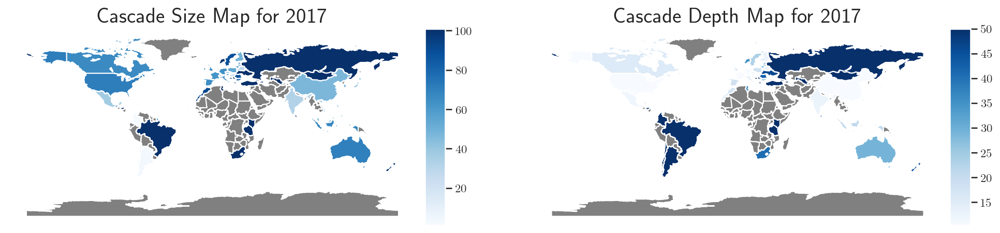

In [46]:
# Read cascade_size and cascade_depth dataframes
cascade_size_df = pd.read_csv("Simulation Results/sim1_cascade_size.csv", index_col = None, header = 0)
cascade_depth_df = pd.read_csv("Simulation Results/sim1_cascade_depth.csv", index_col = None, header = 0)

# Merge
cascade_df = cascade_size_df.merge(cascade_depth_df, left_on = "Country Code", right_on = "Country Code")

# Merge with geodataframe
cascade_map = gdf.merge(cascade_df, how = "left", left_on = "ADM0_A3", right_on = "Country Code")
    
# Plot gray map
fig, (ax_size, ax_depth) = plt.subplots(1, 2, figsize = (16, 20))
cascade_map.plot(color = "gray", ax = ax_size)
cascade_map.plot(color = "gray", ax = ax_depth)

# Remove countries for which cascade size = 0 or cascade depth = 0.
cascade_map = cascade_map[(cascade_map["cascade size"] != 0) & (cascade_map["cascade depth"] != 0)]

# Legend axis
divider_size = make_axes_locatable(ax_size)
cax_size = divider_size.append_axes("right", size = "5%", pad = 0.1)
divider_depth = make_axes_locatable(ax_depth)
cax_depth = divider_depth.append_axes("right", size = "5%", pad = 0.1)    

# Plot chloropleth layer
cascade_map.dropna().plot(column = "cascade size", cmap = "Blues", legend = True, ax = ax_size, cax = cax_size)
ax_size.set_title("Cascade Size Map for " + str(year), fontdict = {'fontsize': 20})
ax_size.set_axis_off()
    
cascade_map.dropna().plot(column = "cascade depth", cmap = "Blues", legend = True, ax = ax_depth, cax = cax_depth)
ax_depth.set_title("Cascade Depth Map for " + str(year), fontdict = {'fontsize': 20})
ax_depth.set_axis_off()

Note that the North American (particularly Canada and the US), West European, Southeast Asian and East Asian regions are associated with a high cascade size but low cascade depth, meaning that shocks that start in these areas only take a few iterations to finish but pervade a large portion of the network. Unsurprisingly, many of the countries in these regions are associated with a high out-eigenvector centrality.

In contrast, many of the countries in the CIS and Eastern European regions are associated with both high cascade size and high cascade depth, meaning that shocks that start here take a long time to finish (and may not even reach equilibrium within 50 iterations) but reach most of the nodes in the network. These must be nodes in the periphery of the IC trade network which are themselves connected to a number of well-connected nodes, allowing shocks to these countries to spread to most of the network. 

In keeping with our core-periphery hypothesis, we can surmise that countries which are associated with low cascade depths on average can probably be said to be <b> core </b> nodes, as shocks to them only take a few iterations to reach equilibrium. Nodes that are associated with high cascade depths can then be said to be <b> peripheral </b> nodes, since shocks to these nodes do not significantly affect the nodes in the network. From the map, however, there does not seem to be a sharp core-periphery divide.

Lastly, some of the countries in the South American regions are also associated with low cascade size and high cascade depth. This signifies that not only do the shocks take a long time to finish (In fact, the shock may not even reach equilibrium within 50 iterations) but they also do not pervade the network significantly. These must be isolated nodes which lie in the periphery of the IC trade network.

As such, we can further classify the nodes into whether shocks to them affect the entire network -- <b> connected </b> nodes -- or only a select few -- <b> isolated </b> nodes. However, the divide between connected and isolated nodes is even less sharp, much more so for core nodes.

##### 4.3.1.2 Distribution based on Shock and Spread Parameters

Text(0, 0.5, 'Cascade depth')

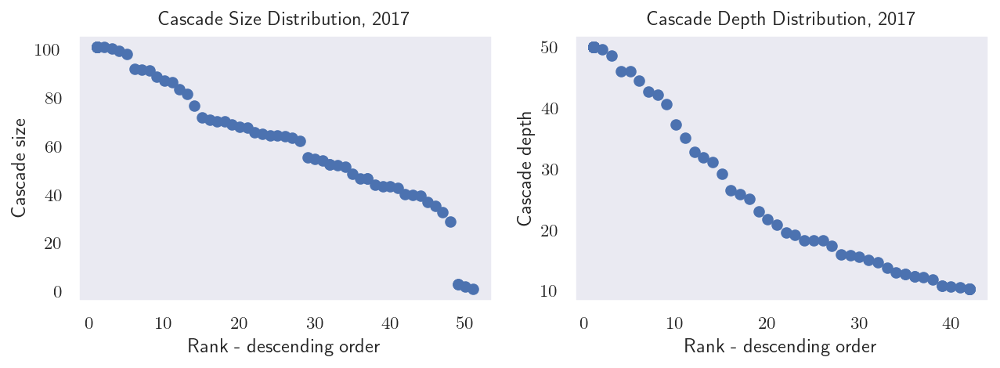

In [47]:
# Plot distribution of cascade depth
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (10, 3))

# Construct list of y-values. Remove 0's in the list
y_list = sorted(cascade_size_df["cascade size"], reverse = True)
y_list = np.array([i for i in y_list if i != 0])

# Construct list of x-values
x_list = stats.rankdata(np.negative(y_list), method = "dense")

ax1.scatter(x_list, y_list)
ax1.set_title("Cascade Size Distribution, 2017")
ax1.set_xlabel("Rank - descending order")
ax1.set_ylabel("Cascade size")

# Construct list of y-values. Remove 0's in the list
y_list = sorted(cascade_depth_df["cascade depth"], reverse = True)
y_list = np.array([i for i in y_list if i != 0])

# Construct list of x-values
x_list = stats.rankdata(np.negative(y_list), method = "dense")

ax2.scatter(x_list, y_list)
ax2.set_title("Cascade Depth Distribution, 2017")
ax2.set_xlabel("Rank - descending order")
ax2.set_ylabel("Cascade depth")

From the geographic distribution, we surmised that we can potentially use cascade depth as a distinguishing metric. To check if this is the case, we plot the rank-size distributions for cascade size and cascade depth, shown above. 

The plots show that on average, both the cascade size and cascade depth are somewhat uniformly distributed across the range of values over which they occur. Both are also roughly linear, suggesting that the rank and the cascade size/depth on average are linearly related.

These results might seem off, contrary to the core-periphery hypothesis that we had earlier posited. However, because we averaged the results across all shock and spread parameters in our selected parameter space, the uniformity may simply be due to this averaging. To check, we run the simulation for shock and spread parameters of 0.1, 0.5 and 0.9 and check the cascade size and depth distributions for each simulation. The results are shown below.

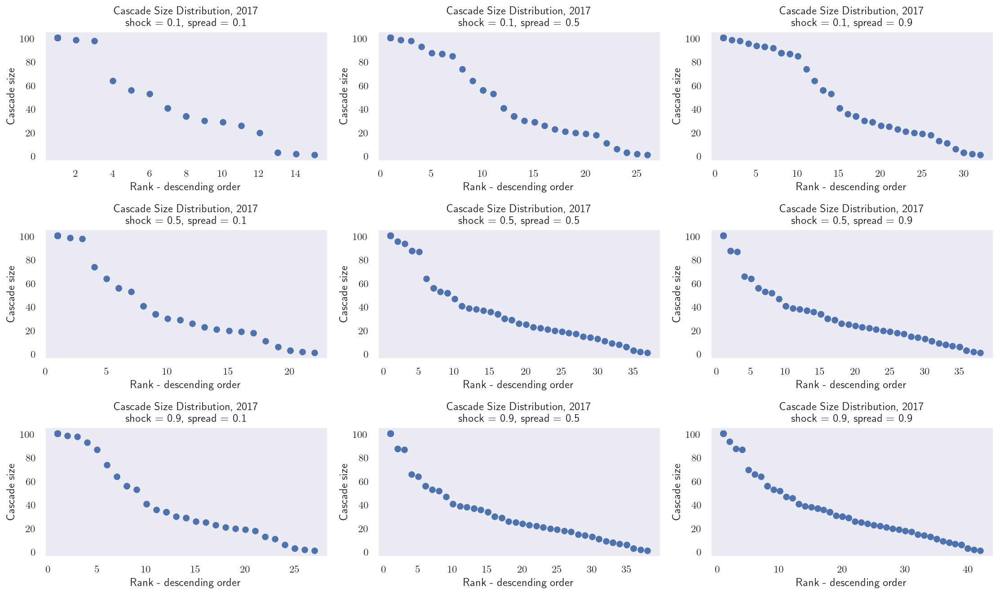

In [48]:
# Run simulation for shock and spread parameters of 0.1, 0.5 and 0.9
fig, ax = plt.subplots(3, 3, figsize = (15, 9))

vals = [0.1, 0.5, 0.9]
for i in range(3):
    for j in range(3):
        metrics_dict = []
        # Construct dataframe of metrics per shock and spread value
        for country in countries:
            df_rows = {}
            res = sim_cascade_1(all_graphs[2017], country, shock_param = vals[i], spread_param = vals[j], k = 50)
            df_rows["Country Code"] = country
            df_rows["cascade size"] = res["cascade size"]
            df_rows["cascade depth"] = res["cascade depth"]
            metrics_dict.append(df_rows)

        metrics_df = pd.DataFrame(metrics_dict)
        
        # Construct list of y-values. Remove 0's in the list
        y_list = sorted(metrics_df["cascade size"], reverse = True)
        y_list = np.array([k for k in y_list if k != 0])

        # Construct list of x-values
        x_list = stats.rankdata(np.negative(y_list), method = "dense")

        ax[i, j].scatter(x_list, y_list)
        ax[i, j].set_title("Cascade Size Distribution, 2017 \n shock = " + str(vals[i]) + ", spread = " + str(vals[j]))
        ax[i, j].set_xlabel("Rank - descending order")
        ax[i, j].set_ylabel("Cascade size")

fig.tight_layout()

As we increase the shock and spread parameter values, the cascade size begins taking on the shape of the distribution in the averaged variant from earlier. Thus, the distribution of the averaged cascade size seems to be somewhat representative of the cascade size distribution for arbitrary values of the shock and spread parameter. 

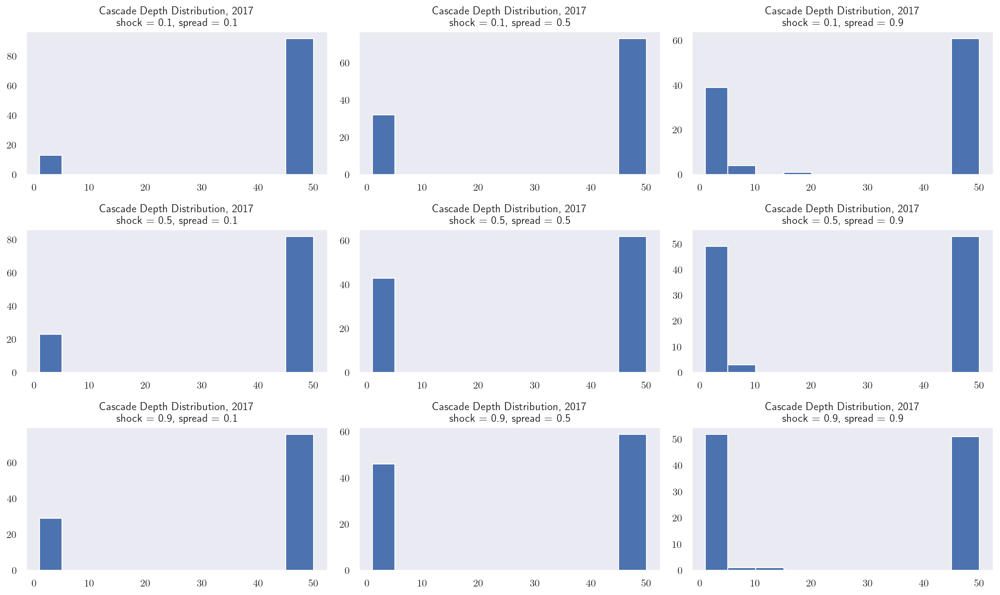

In [49]:
# Run simulation for shock and spread parameters of 0.1, 0.5 and 0.9
fig, ax = plt.subplots(3, 3, figsize = (15, 9))

vals = [0.1, 0.5, 0.9]
for i in range(3):
    for j in range(3):
        metrics_dict = []
        # Construct dataframe of metrics per shock and spread value
        for country in countries:
            df_rows = {}
            res = sim_cascade_1(all_graphs[2017], country, shock_param = vals[i], spread_param = vals[j], k = 50)
            df_rows["Country Code"] = country
            df_rows["cascade size"] = res["cascade size"]
            df_rows["cascade depth"] = res["cascade depth"]
            metrics_dict.append(df_rows)

        metrics_df = pd.DataFrame(metrics_dict)
        
        # Construct list of y-values. Remove 0's in the list
        y_list = sorted(metrics_df["cascade depth"], reverse = True)
        y_list = np.array([k for k in y_list if k != 0])

        ax[i, j].hist(y_list, bins = [1, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50])
        ax[i, j].set_title("Cascade Depth Distribution, 2017 \n shock = " + str(vals[i]) + ", spread = " + str(vals[j]))

fig.tight_layout()

In the histograms above, our bin edges are multiples of 10 (Thus, the bins are from 0 to 10, from 10 to 20, and so on.)

The same is not true for the cascade depth, however. The cascade depth only seems to take on a number of values regardless of the values assigned to the shock and spread parameter. More notably, we see a large break in the distribution regardless of the values assigned; the simulation does not seem to reach equilibrium (i.e., takes 50 iterations in total) after setting some of the nodes as starting nodes while it does so in less than 10 iterations for some of the other nodes. Once again, this supports our earlier core-periphery hypothesis. In fact, this shows that we can use the cascade depth as a heuristic with which to identify core and peripheral nodes in the network. This is further explored in a later section.

From these figures, we observe a bimodal distribution for cascade depth, with the first mode corresponding to influential countries where the simulation ends early and the second mode corresponding to countries for which the simulation does not reach an equilibrium after 50 iterations.

Furthermore, notice that as we increase either the shock or spread parameter, nodes begin "jumping" from the right bin to the left bin. This is intuitively sound, as increasing either the shock or spread parameter increases the size and the extent of the shock, respectively, which leads to the simulation reaching equilibrium/requiring less iterations to reach equilibrium. It is these nodes "jumping" from one bin to the other which leads to the relative uniformity of the averaged cascade depth distribution that we had seen earlier.

The bimodality lends better credence to our core-periphery hypothesis and will later on allow us to designate nodes as core, peripheral or intermediate. 

##### 4.3.1.3 Identifying Core and Peripheral Nodes

We now plot cascade depth against cascade size. Similar to what we did earlier, we restrict the parameter space to the set of values 0.1, 0.5 and 0.9 and run the simulation for these values to get a better picture of how cascade size and depth vary in relation to each other.

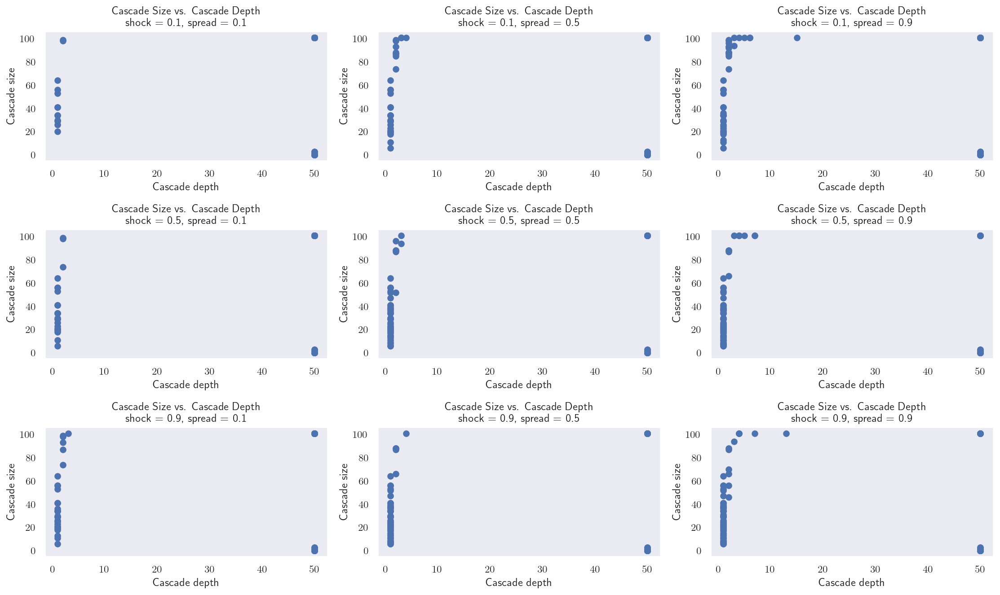

In [50]:
# Run simulation for shock and spread parameters of 0.1, 0.5 and 0.9
fig, ax = plt.subplots(3, 3, figsize = (15, 9))

vals = [0.1, 0.5, 0.9]
for i in range(3):
    for j in range(3):
        metrics_dict = []
        # Construct dataframe of metrics per shock and spread value
        for country in countries:
            df_rows = {}
            res = sim_cascade_1(all_graphs[2017], country, shock_param = vals[i], spread_param = vals[j], k = 50)
            df_rows["Country Code"] = country
            df_rows["cascade size"] = res["cascade size"]
            df_rows["cascade depth"] = res["cascade depth"]
            metrics_dict.append(df_rows)

        metrics_df = pd.DataFrame(metrics_dict)
        
        ax[i, j].scatter(metrics_df["cascade depth"], metrics_df["cascade size"])
        ax[i, j].set_title("Cascade Size vs. Cascade Depth \n shock = " + str(vals[i]) + ", spread = " + str(vals[j]))
        ax[i, j].set_xlabel("Cascade depth")
        ax[i, j].set_ylabel("Cascade size")
        
fig.tight_layout()

As before, we see a clear divide between core and peripheral nodes for all cases with respect to cascade depth. Furthermore, increasing either parameter leads to nodes from the right side of the graph "migrating" to the left side. 

More notably, though, we also see a divide between peripheral nodes in terms of cascade size. Setting some peripheral nodes as the starting node results in the simulation affecting only a select number of nodes despite it never reaching equilibrium. For the other peripheral nodes, however, the simulation ends up affecting almost the entire network. This is in line with the connected vs. isolated node distinction that we made earlier. This distinction does not seem to be especially marked among the core nodes, however. While this distinction undoubtedly exists, though, it does not seem to be particularly important. 

We can now designate each node as either a core or peripheral node. As we can see from Figure 5.17, however, the designation depends on the value of both the shock and spread parameter. To get around this problem, we follow Li et al. (2014) and compute for the minimum value of the shock parameter required to designate a node as a core node, setting the spread parameter equal to 1. In this case, we define a core node as one which requires at most 10 iterations to reach equilibrium, which is consistent with Figure 5.17. The shock parameter is computed using a modified bisection search algorithm which is run for 100 iterations, during which the computed values for the minimum shock parameter have been found to converge.

After this, we rank the nodes based on the minimum shock parameter. We can then set a threshold shock parameter and designate all countries with a smaller minimum shock parameter as core nodes, with the rest being peripheral nodes.

In [51]:
# Calculate minimum shock parameter
#min_shock_1 = {}
#num_iter = 100
#for country in countries:
#    high = 1
#    low = 0
    
#    for i in range(num_iter):
#        shock = (high + low) / 2
#        res = sim_cascade_1(all_graphs[2017], country, shock_param = shock, spread_param = 1, k = 50)
#        if res["cascade depth"] > 10:
#            low = shock
#        elif res["cascade depth"] <= 10:
#            high = shock
            
#    min_shock_1[country] = shock

# Create dataframe
#min_shock_1_df = pd.DataFrame.from_dict(min_shock_1, orient = "index")
#min_shock_1_df.rename(columns = {0: "shock"}, inplace = True)

# Export dataframe as csv
#min_shock_1_df.to_csv(os.path.join(output_dir, "min_shock_exports.csv"), index = False)

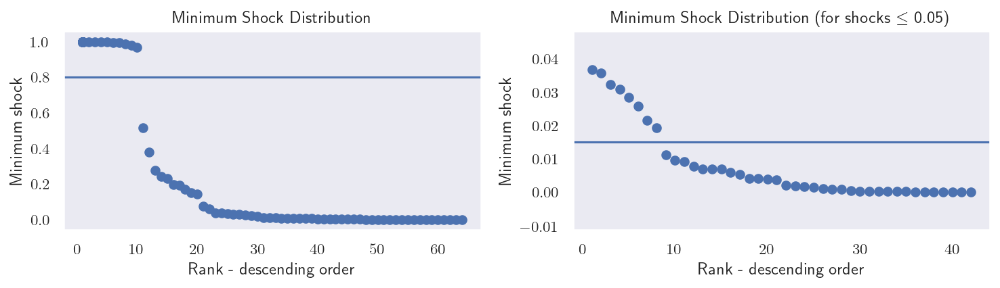

In [53]:
# Load min_shock_exports
min_shock_1_df = pd.read_csv("Simulation Results/min_shock_exports.csv", header = 0)

# Remove all countries for which min_shock_1["shock"] != 1
#min_shock_1_df = min_shock_1_df[min_shock_1_df["shock"] != 1]

# Plot distribution of cascade depth
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (10, 3))

# Construct list of y-values. Remove 0's in the list
y_list = sorted(min_shock_1_df["shock"], reverse = True)
y_list_short = np.array([i for i in y_list if i < 0.05])

# Construct list of x-values
x_list = stats.rankdata(np.negative(y_list), method = "dense")
x_list_short = stats.rankdata(np.negative(y_list_short), method = "dense")

ax1.scatter(x_list, y_list)
ax1.axhline(y = 0.8)
ax1.set_title("Minimum Shock Distribution")
ax1.set_xlabel("Rank - descending order")
ax1.set_ylabel("Minimum shock")

ax2.scatter(x_list_short, y_list_short)
ax2.axhline(y = 0.015)
ax2.set_title("Minimum Shock Distribution (for shocks $\\leq$ 0.05)")
ax2.set_xlabel("Rank - descending order")
ax2.set_ylabel("Minimum shock")

fig.tight_layout()

In [92]:
# Set threshold shock parameter to 5e-4
threshold1 = 0.8
threshold2 = 0.015
inner_core = min_shock_1_df[min_shock_1_df["shock"] <= threshold2]["Country Code"].tolist()
outer_core = min_shock_1_df[(min_shock_1_df["shock"] >= threshold2) & (min_shock_1_df["shock"] <= threshold1)]["Country Code"].tolist()
periphery = min_shock_1_df[min_shock_1_df["shock"] >= threshold1]["Country Code"].tolist()
print("inner core: ", inner_core)
print("outer core: ", outer_core)
print("periphery: ", periphery)

# Create dataframe countries_df
countries_df = pd.DataFrame(list(all_graphs[2017].nodes), columns = ["Country Code"])
countries_df["Designation"] = 0

# Add designation
for country in inner_core:
    countries_df.loc[countries_df["Country Code"] == country, "Designation"] = "inner core"

for country in outer_core:
    countries_df.loc[countries_df["Country Code"] == country, "Designation"] = "outer core"
                                                                         
for country in periphery:
    countries_df.loc[countries_df["Country Code"] == country, "Designation"] = "periphery"

# Remove all other countries
countries_df = countries_df[countries_df["Designation"] != 0]

inner core:  ['IRL', 'SGP', 'CHN', 'MEX', 'BGR', 'VNM', 'DNK', 'MYS', 'KOR', 'USA', 'CAN', 'MLT', 'CHE', 'FIN', 'BEL', 'PRT', 'MAR', 'ITA', 'CRI', 'ARE', 'HKG', 'ISR', 'NLD', 'SWE', 'PHL', 'IDN', 'FRA', 'AUT', 'JPN', 'HUN', 'GBR', 'CZE', 'DEU', 'ESP']
outer core:  ['LTU', 'GRC', 'BLR', 'ROU', 'UKR', 'TUR', 'NOR', 'POL', 'SVK', 'EST', 'HRV', 'IND', 'LUX', 'ZAF', 'NZL', 'TUN', 'SVN', 'AUS', 'LVA', 'LKA']
periphery:  ['KEN', 'SRB', 'CYP', 'BRA', 'GTM', 'SLV', 'ZWE', 'BOL', 'JAM', 'BRB', 'ISL', 'KAZ', 'MNE', 'URY', 'BRN', 'DOM', 'MKD', 'BWA', 'LBN', 'UZB', 'MDA', 'SAU', 'SEN', 'DZA', 'ECU', 'CHL', 'LSO', 'MNG', 'MWI', 'AZE', 'HND', 'AND', 'PRY', 'TZA', 'MDG', 'EGY', 'BIH', 'SWZ', 'PER', 'LCA', 'BHR', 'NAM', 'ARG', 'GUY', 'RUS', 'COL', 'CIV', 'PAK', 'ZMB', 'GEO', 'NIC']


Setting a shock parameter threshold of 0.0005, we can visualize the geographic distribution of core and peripheral nodes using a chloropleth map, as in the figure below.

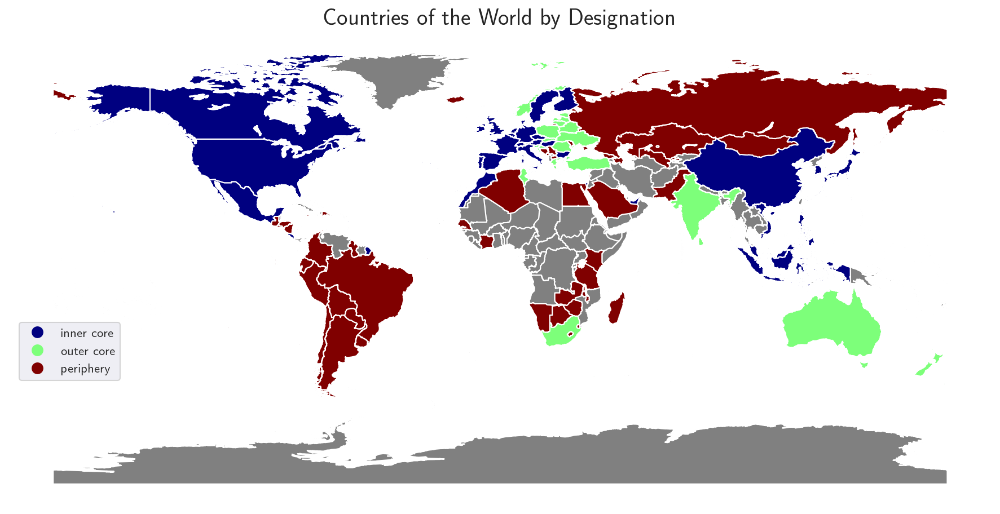

In [93]:
# Merge geodataframe with countries_df
countries_map = gdf.merge(countries_df, how = "left", left_on = "ADM0_A3", right_on = "Country Code")

# Plot gray map
ax = countries_map.plot(color = "gray", figsize = (15, 20))

# Remove countries for which designation is neither core nor periphery
countries_map = countries_map.dropna()

# Assign number to each region
designation_mapping = {"inner core": 0, "outer core": 1, "periphery": 2}
countries_map["Designation No."] = countries_map["Designation"].apply(lambda x: designation_mapping[x])

# Plot map
countries_map.plot(column = "Designation No.", categorical = True, cmap = "jet", figsize = (15, 20), legend = True, ax = ax)
ax.set_title("Countries of the World by Designation", fontdict = {'fontsize': 20})
ax.set_axis_off()

# Modify legend
legend = ax.get_legend()
legend.set_bbox_to_anchor((.12, .4))
for i in range(len(designation_mapping)):
    legend.get_texts()[i].set_text(list(designation_mapping.keys())[i])

In line with earlier observations, the Southeast Asian/East Asian region is a major hub in the IC trade network, along with the US, Germany, France, Ireland, Israel and The Netherlands. These also happen to be the countries with high out-eigenvector centralities.

The network core is often comprised of central and densely connected nodes, while the periphery consists of sparsely connected nodes that are linked to the core. Often, this implies that there must be a significant number of core-core and core-periphery links but not much periphery-periphery links.

To examine this, we look at a number of metrics to characterize core and peripheral nodes. These will include at the node level:
- average out-degree centrality
- average out-strength centrality
- average betweenness centrality
- average out-eigenvector centrality

and at the edge level:
- average link weight
- number of links, normalized by greatest possible number of links

Starting at the node level,

In [94]:
# Merge
countries_df = countries_df.merge(degree_df, left_on = "Country Code", right_on = "Country Code")
countries_df = countries_df.merge(strength_df, left_on = "Country Code", right_on = "Country Code")
countries_df = countries_df.merge(betweenness_df, left_on = "Country Code", right_on = "Country Code")
countries_df = countries_df.merge(eigenvector_df, left_on = "Country Code", right_on = "Country Code")

# get summary
countries_df.groupby(["Designation"]).mean()

,in-degree,out-degree,in-strength,out-strength,betweenness,in-eigenvector,out-eigenvector
Designation,,,,,,,
inner core,17.2941176471,31.9411764706,0.0281359659,0.0293792128,0.0566571849,0.0494636130,0.0808870910
outer core,23.7500000000,9.4000000000,0.0013167174,0.0000542109,0.0078883495,0.0119871617,0.0000885774
periphery,4.7843137255,0.6470588235,0.0003341728,0.0000004421,0.0003148384,0.0040959420,0.0000002294


We find that core nodes tend to be associated with significantly higher out-degrees, higher out-strength centralities, higher betweenness centralities and higher out-eigenvector centralities.

We now proceed with examining the network at an edge level.

In [95]:
trade_desig_df = trade_df[trade_df["year"] == 2017]

# Get source - designation
trade_desig_df = trade_desig_df.merge(countries_df[["Country Code", "Designation"]], left_on = "source", right_on = "Country Code")
trade_desig_df.drop(["Country Code"], axis = 1, inplace = True)
trade_desig_df.rename(columns = {"Designation": "source - designation"}, inplace = True)

# Get target - designation
trade_desig_df = trade_desig_df.merge(countries_df[["Country Code", "Designation"]], left_on = "target", right_on = "Country Code")
trade_desig_df.drop(["Country Code"], axis = 1, inplace = True)
trade_desig_df.rename(columns = {"Designation": "target - designation"}, inplace = True)

In [97]:
# Get average link weight
link_weight = trade_desig_df.groupby(["source - designation", "target - designation"])["weight"].mean().reset_index(name = "average link weight")

# Display sorted table
link_weight.sort_values(by = ["average link weight"], ascending = False)

,source - designation,target - designation,average link weight
0,inner core,inner core,487629051.7773476839
2,inner core,periphery,22518608.0633187629
1,inner core,outer core,17290735.2508352734
5,outer core,periphery,2625335.8017947599
3,outer core,inner core,1647297.7182290393
4,outer core,outer core,855478.9668428004
8,periphery,periphery,278268.5568675100
6,periphery,inner core,54008.1614258817
7,periphery,outer core,53862.5882848540


In [99]:
# Get count based on values in source - designation and target - designation
count = trade_desig_df.groupby(["source - designation", "target - designation"]).size().reset_index(name = "count")

# Map designations to list of countries
num_designation = {"inner core": len(inner_core), "outer core": len(outer_core), "periphery": len(periphery)}

# Get denominator
count["denom"] = np.where(count["source - designation"] == count["target - designation"], count["source - designation"].apply(lambda x: num_designation[x]) * (count["target - designation"].apply(lambda x: num_designation[x]) - 1), count["source - designation"].apply(lambda x: num_designation[x]) * count["target - designation"].apply(lambda x: num_designation[x]))

# Get normalized count
count["norm_count"] = count["count"] / count["denom"]

# Display sorted table
count[["source - designation", "target - designation", "norm_count"]].sort_values(by = ["norm_count"], ascending = False)

,source - designation,target - designation,norm_count
1,inner core,outer core,0.5720588235
0,inner core,inner core,0.4509803922
4,outer core,outer core,0.2131578947
2,inner core,periphery,0.1101499423
3,outer core,inner core,0.1058823529
5,outer core,periphery,0.0343137255
8,periphery,periphery,0.0070588235
6,periphery,inner core,0.0057670127
7,periphery,outer core,0.0049019608


We find that core-core links tend to have significantly higher weights compared to the rest. This explains why these nodes have been designated as core nodes based on the simulation. 

Moreover, core-intermediate, core-core and intermediate-intermediate links tend to be much more frequent. 

#### 4.3.2 Exposure

In [62]:
# Load sim1_exposure.csv as dataframe and convert to numpy array. 
exposure_df = pd.read_csv("Simulation Results/sim1_exposure.csv", index_col = 0)

# Compute average and maximum exposure
exposure_countries_df = pd.DataFrame(list(exposure_df.columns), columns = ["Country Code"])

exposure_df["source"] = exposure_df.idxmax(axis = 0)
exposure_df["recipient"] = exposure_df.drop(["source"], axis = 1).idxmax(axis = 1)
exposure_df["maximum exposure given"] = exposure_df.max(axis = 0)
exposure_df["maximum exposure received"] = exposure_df.max(axis = 1)

exposure_countries_df = exposure_countries_df.merge(exposure_df[["source", "recipient", "maximum exposure given", "maximum exposure received"]], left_on = "Country Code", right_on = exposure_df.index)

exposure_df.drop(["source", "recipient", "maximum exposure given", "maximum exposure received"], axis = 1, inplace = True)

##### 4.3.2.1 Exposure in the Context of the Philippines

We wish to know which countries are affected by shocks from the Philippines, as well as which countries' shocks affect the Philippines the most. 

In [63]:
exposure_countries_df[exposure_countries_df["Country Code"] == "PHL"]

,Country Code,source,recipient,maximum exposure given,maximum exposure received
26,PHL,BEL,HKG,0.0858804018,0.1502006133


We find that the Philippines affects Hong Kong the most, with Hong Kong being exposed to 15.02% of the shock from the Philippines on average. Meanwhile, Belgium affects the Philippines the most, with the country being exposed to 8.59% of the shocks from Belgium on average.

We can look into the exposure matrix to see the top 10 countries most susceptible to shocks from the Philippines and the top 10 countries whose shocks the Philippines is the most susceptible to.

In [64]:
exposure_df.loc["PHL", :].sort_values(ascending = False).head(10)

HKG   0.1502006133
CHN   0.1064487653
SGP   0.0605339492
DEU   0.0279158430
NLD   0.0164048518
MEX   0.0101674301
MYS   0.0083895435
VNM   0.0069181383
FRA   0.0067937776
CAN   0.0022847275
Name: PHL, dtype: float64

In [65]:
exposure_df.loc[:, "PHL"].sort_values(ascending = False).head(10)

BEL   0.0858804018
ITA   0.0326583391
CZE   0.0298521031
USA   0.0167613309
KOR   0.0148975621
TUN   0.0120685283
JPN   0.0068295375
NOR   0.0061298939
ISR   0.0030431331
MAR   0.0023936015
Name: PHL, dtype: float64

## 5. Cascading Failure-Based Simulation (Supply-Side Increase)

### 5.1 Implementation

We again perform a cascading failure-based simulation on the integrated circuit network. This section, however, is devoted to simulating a sudden supply-side increase in one of the nodes in the IC network. The descriptions, assumptions and eventual implementation of this simulation will be as follows.  

#### 5.1.1 Description and Assumptions

The primary goal of this model is to determine how an increase in one country's IC supply can potentially impact the other countries in the trade network. The model is built based on trade networks which themselves are based on annual data regarding integrated circuit trade given by the United Nations' Comtrade database. In particular, we will be using their latest dataset (from 2017). As such, we cannot observe the reaction to supply-side shocks on a short time scale. Moreover, because the data is based on year-end reports, the shock is assumed to have occurred after the end of 2017. Trade shocks take some time to promulgate, however, and the trade network measures have been shown to be somewhat consistent from year to year, so these assumptions are not entirely unrealistic.

Our model is based on those of Burkholz & Schweitzer (2019) and Gephart et al. (2016). We begin with $n$ trading partners and an initial trade matrix $F^{0}$, based on the 2017 trade flows sourced from the UN Comtrade database. The trade matrix is structured such that the trade flow from country $i$ to country $j$ at time 0 is given by $F^{t}_ {ij}$. The total imports at time $t$ to country $k$, denoted by $e^{t}_{k}$ is given by the row sums; i.e., 

\begin{equation}
e^{t}_{k} = \sum_{l = 1}^{n}F^{t}_{kl}
\end{equation}

The total imports at time $t$ to country $k$, denoted by $i^{t}_{k}$ is given by the column sums; i.e., 

\begin{equation}
i^{t}_{k} = \sum_{j = 1}^{n}F^{t}_{jk}
\end{equation}

We then introduce a perturbation to the trade network by increasing the supply of some country $k$ at iteration $t = 1$ by fraction $s$, where $0 < s \leq 1$ (the shock parameter). That is,

\begin{equation}
e^{1}_{j} = (1 - s)e^{0}_{j}
\end{equation}

while $e^{1}_{k} = e^{0}_{k}$ for all countries $k \neq j$.

 We also assume that the reduction in supply is not fully compensated for, and that only a proportion $q$, where $0 < q \leq 1$ (the spread parameter) is transmitted. We let the matrix $E^{t}$ denote an export-only variant of the adjacency matrix for shocked nodes. That is, $E^{t}_{j, k} = 1$  if a trade link exists from shocked country j to country k (not from country k to country j) and 0 otherwise.

The shock given by $qse^{0}_{j}$ is transmitted to the export trading partners in accordance to the transfer matrix $T^{t}$. By default, we assume that the shocks are distributed proportionally, so that the elements of the transfer matrix at $t = 1$ are given by

\begin{equation}
T^{1}_{jk} = \frac{F^{0}_{jk}}{e^{0}_{j}}
\end{equation}

Thus, at $t = 1$, the trade matrix $F^{1}$ is given by

\begin{equation}
F^{1}_{jk} = F^{0}_{jk} - T^{1}_{jk} * E^{t}_{jk} \cdot qse^{0}_{j}
\end{equation}

where $*$ denotes element-wise multiplication and $\cdot$ denotes scalar multiplication.

We update the exports, imports and transfer matrices accordingly, with respect to the new trade matrix $F^{1}$.

The starting node's export partners now have their imports reduced. This creates a demand deficit in these countries and in compensation, they reduce their own exports to their export partners. This then creates a demand deficit, so that these export partners reduce their exports to their export partners.

This continues until a node is unable to pass the shock any further because its exports have been reduced to zero (or less than zero). We denote this iteration as $t^{eq}$.

Thus, we can iteratively define the dynamics as follows:

\begin{equation}
F^{t+1}_{jk} = F^{t}_{jk} - T^{t}_{jk} * E_{jk} \cdot qse^{t}_{j}
\end{equation}

Intrinsic to the model above are a number of assumptions. These include:
- The shocks are assumed to have occurred at the start of the year.
- The shocks are observed on an annual time scale.
- There are global parameters (shock parameter, spread parameter) which define the extent and spread of the shock, regardless of the starting node.
- Demand for integrated circuits in all countries is assumed to be fixed. Thus, in response to decreased supply, they reduce exports.
- The shocks are spread proportionally to a country's export partners.  
- The model reaches equilibrium when one of the nodes fails -- that is, if one of the nodes can no longer reduce its exports to compensate for the demand deficit. In truth, the other nodes can continue exporting, independent of any other nodes' failure.

Due to limitations in computing power, we impose the following additional assumptions:
- The shock and spread parameter can only take on values which are multiples of 0.1.

In [68]:
# Get neigbors with respect to in-edges of all nodes
def neighbor_in(graph):
    neighbor_dict = {}

    for node in list(graph.nodes):
        neighbor_list = []
        for source, target in list(graph.in_edges(node)):
            neighbor_list.append(source)
        neighbor_dict[node] = neighbor_list
    
    return neighbor_dict

In [69]:
def sim_cascade_2(graph, start_node, k, shock_param, spread_param, kmax = 50):
    # Initialize matrices
    countries = list(graph.nodes)
    nc = len(countries)
    neighbors = neighbor_in(graph)
    
    trade = np.zeros((kmax + 1, nc, nc), dtype = 'float64')
    imports = np.zeros((kmax + 1, nc), dtype = 'float64')
    transfer = np.zeros((nc, nc), dtype = 'float64')
    shocks_prev = np.zeros(nc, dtype = 'float64')
    
    # Initialize trade matrix
    adj = np.asarray(nx.adjacency_matrix(graph).todense())
    trade[0, :, :] = adj.copy()
    imports[0, :] = np.sum(trade[0, :, :], axis = 0)
        
    # Initialize transfer matrix and then normalize
    transfer = trade[0, :, :]
    col_sums = np.sum(transfer, axis = 0)
    transfer = np.divide(transfer, col_sums, where = col_sums != 0)
    transfer = np.nan_to_num(transfer)
    
    # Initialize variables for the metrics
    cascade_depth = 0
    cascade_nodes = []
    exposure_arr = np.zeros(nc, dtype = 'float64')
    
    # Main loop
    for step in range(1, k + 1):
        # Initialize matrices
        temp_imports = np.zeros(nc, dtype = 'float64')
        delta_imports = np.zeros(nc, dtype = 'float64')
        delta_trade = np.zeros((nc, nc), dtype = 'float64')
        shocked = np.zeros((nc, nc), dtype = 'float64')
        shocks = np.zeros(nc, dtype = 'float64')
        
        # Initial shock
        if step == 1:
            # Initialize shock matrix
            for neighbor in neighbors[start_node]:
                shocked[countries.index(neighbor), countries.index(start_node)] = 1
            
            # Get all "children" of the start_node (i.e., all neighbors wrt outgoing edges)
            children = neighbors[start_node]
            
            # Initial shock: decrease imports of start_node by shock_param
            shocks[countries.index(start_node)] = shock_param * imports[0, countries.index(start_node)]
        
        # Subsequent shocks
        else:
            # Initialize children_placeholder
            children_placeholder = []
            
            # Run through all the children's neighbors. Store the neighbors of these neighbors in children_placeholder
            for child in children:
                for neighbor in neighbors[child]:
                    shocked[countries.index(neighbor), countries.index(child)] = 1
                    children_placeholder.append(neighbor)
            
            # Replace children with children_placeholder
            children = list(set(children_placeholder))
            
            # Subsequent shocks: decrease imports of affected nodes by spread_param
            shocks = shocks_prev * spread_param
        
        # Allocate shock to trade partners
        delta_trade = transfer * shocked * shocks
        delta_imports = np.sum(delta_trade, axis = 0)
        
        # Store all shocks received by each country in this iteration for reference in next iteration
        shocks_prev = np.sum(delta_trade, axis = 1)
        
        # Store new imports in temp_imports.
        temp_imports = imports[step - 1, :] - delta_imports
        
        if np.any(temp_imports < 0):
            # Get exposure for all countries. 
            shock_init = shock_param * imports[0, countries.index(start_node)]
                
            if shock_init > 0:
                exposure_arr = (imports[1, :] - temp_imports) / shock_init
            else:
                exposure_arr = imports[1, :] - temp_imports # list of zeroes
        
            # Zero out exposure for start_node
            #exposure_arr[countries.index(start_node)] = 0
                
            # Stop if there are negative imports.
            break
            
        else:
            # Update trade and export matrices
            imports[step, :] = imports[step - 1, :] - delta_imports
            trade[step, :, :] = trade[step - 1, :] - delta_trade
        
            # Update transfer matrix
            transfer = trade[step, :, :]
            col_sums = np.sum(transfer, axis = 0)
            transfer = np.divide(transfer, col_sums, where = col_sums != 0)
            transfer = np.nan_to_num(transfer)
            
            # Update cascade depth
            cascade_depth += 1
            
            # Update cascade_nodes
            cascade_nodes.extend(children)
    
    return {"imports": imports, "cascade depth": cascade_depth, "cascade size": len(set(cascade_nodes)), "exposure": exposure_arr}

### 5.2 Results

We have just developed an analogous model corresponding to a supply-side increase. In this section, we will use the three metrics discussed to measure the effects of perturbing each node in the network in accordance with this model of supply-side increase. Once again, we will average the results across different values of the parameters, considering values from 0 to 1 in increments of 0.1 for both the shock and spread parameter. Unless explicitly stated, the results that will follow will be on average.

In [70]:
def run_sim_cascade_2(graph, start_node, k):
    # Initialize variables
    countries = list(graph.nodes)
    nc = len(countries)
    iter_count = 0
    res_total = {"cascade depth": 0, "cascade size": 0, "exposure": np.zeros(nc, dtype = 'float64')}
    
    # Run for all possible values in parameter space
    for shock in np.arange(0, 1, 0.1):
        for spread in np.arange(0, 1, 0.1):
            iter_count += 1
            res = sim_cascade_2(graph, start_node, k, shock, spread)
            res_total["cascade depth"] += res["cascade depth"]
            res_total["cascade size"] += res["cascade size"]
            res_total["exposure"] += res["exposure"]
    
    # Average all metrics
    res_ave = {key: val / iter_count for key, val in res_total.items()}
    
    return res_ave

Because of the number of parameter values it has to run through, it takes a long time for the `run_sim_cascade_2` function to run. To save on time, we run the `run_sim_cascade_2` function once for all countries and store the cascade size, cascade depth and exposure values in dictionaries and in files.

In [71]:
# Find cascade size, depth and exposure for all countries
#graphs = all_graphs[2017] 
#countries = list(graphs.nodes)
#nc = len(countries)
#all_cascade_sizes = {}
#all_cascade_depths = {}
#exposure_mat = np.zeros((nc, nc), dtype = 'float64')

# Map cascade sizes and depths to countries
#for country in countries:
#    res = run_sim_cascade_2(graph = graphs, start_node = country, k = 50)
#    all_cascade_sizes[country] = res["cascade size"]
#    all_cascade_depths[country] = res["cascade depth"]
#    exposure_mat[countries.index(country), :] = res["exposure"]
    
# Convert dictionaries (and matrix) to dataframes
#cascade_size_df = pd.DataFrame.from_dict(all_cascade_sizes, orient = "index")
#cascade_size_df.rename(columns = {0: "cascade size"}, inplace = True)

#cascade_depth_df = pd.DataFrame.from_dict(all_cascade_depths, orient = "index")
#cascade_depth_df.rename(columns = {0: "cascade depth"}, inplace = True)

#exposure_df = pd.DataFrame(data = exposure_mat.astype(np.float))
#exposure_df.set_axis(countries, axis = 0, inplace = True)
#exposure_df.set_axis(countries, axis = 1, inplace = True)

# Reset index
#cascade_size_df.reset_index(inplace = True)
#cascade_size_df.rename(columns = {"index": "Country Code"}, inplace = True)

#cascade_depth_df.reset_index(inplace = True)
#cascade_depth_df.rename(columns = {"index": "Country Code"}, inplace = True)

# Create outgoing directory
#output_dir = "./Simulation Results"
#if not os.path.exists(output_dir):
#    os.mkdir(output_dir)

# Write to csv files
#cascade_size_df.to_csv(os.path.join(output_dir, "sim2_cascade_size.csv"), index = False)
#cascade_depth_df.to_csv(os.path.join(output_dir, "sim2_cascade_depth.csv"), index = False)
#exposure_df.to_csv(os.path.join(output_dir, "sim2_exposure.csv"))

#### 5.2.1 Cascade Size and Depth

##### 5.2.1.1 Cascade Size and Depth Distribution

We run the simulation for all countries, taking note of the cascade size and cascade depth whenever we perturb each one. To visualize the results, we use a chloropleth map and a scatter plot.

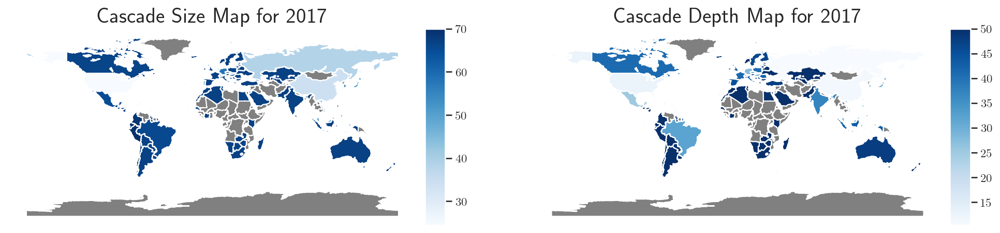

In [72]:
# Read cascade_size and cascade_depth dataframes
cascade_size_df = pd.read_csv("Simulation Results/sim2_cascade_size.csv", index_col = None, header = 0)
cascade_depth_df = pd.read_csv("Simulation Results/sim2_cascade_depth.csv", index_col = None, header = 0)

# Merge
cascade_df = cascade_size_df.merge(cascade_depth_df, left_on = "Country Code", right_on = "Country Code")

# Merge with geodataframe
cascade_map = gdf.merge(cascade_df, how = "left", left_on = "ADM0_A3", right_on = "Country Code")
    
# Plot gray map
fig, (ax_size, ax_depth) = plt.subplots(1, 2, figsize = (16, 20))
cascade_map.plot(color = "gray", ax = ax_size)
cascade_map.plot(color = "gray", ax = ax_depth)

# Remove countries for which cascade size = 0 or cascade depth = 0.
cascade_map = cascade_map[(cascade_map["cascade size"] != 0) & (cascade_map["cascade depth"] != 0)]

# Legend axis
divider_size = make_axes_locatable(ax_size)
cax_size = divider_size.append_axes("right", size = "5%", pad = 0.1)
divider_depth = make_axes_locatable(ax_depth)
cax_depth = divider_depth.append_axes("right", size = "5%", pad = 0.1)   

# Plot chloropleth layer
cascade_map.dropna().plot(column = "cascade size", cmap = "Blues", legend = True, ax = ax_size, cax = cax_size)
ax_size.set_title("Cascade Size Map for " + str(year), fontdict = {'fontsize': 20})
ax_size.set_axis_off()
    
cascade_map.dropna().plot(column = "cascade depth", cmap = "Blues", legend = True, ax = ax_depth, cax = cax_depth)
ax_depth.set_title("Cascade Depth Map for " + str(year), fontdict = {'fontsize': 20})
ax_depth.set_axis_off()

Notably, countries like Russia, China, US and Thailand have a low cascade size and low cascade depth, meaning that shocks to these countries take only a few iterations to reach equilibrium while affecting only a few nodes in the network. This suggests that these countries have a number of high-volume links with other countries. Meanwhile, some countries in Southeast Asian/East Asia and Europe have a high cascade size and low cascade depth. Shocks that start in these areas only take a few iterations to finish but pervade a large portion of the network. These countries probably constitute the core of the network.

Most of the countries, however, are associated with both high cascade size and high cascade depth. This signifies that shocks in these countries take a long time to finish but reach most of the nodes in the network. These must be nodes in the periphery of the IC trade network which are themselves connected to a number of well-connected nodes, allowing shocks to these countries to spread to most of the network. 

Similar to what we did earlier, we plot cascade size vs. cascade depth, restricting the parameter space to the set of values 0.1, 0.5 and 0.9.

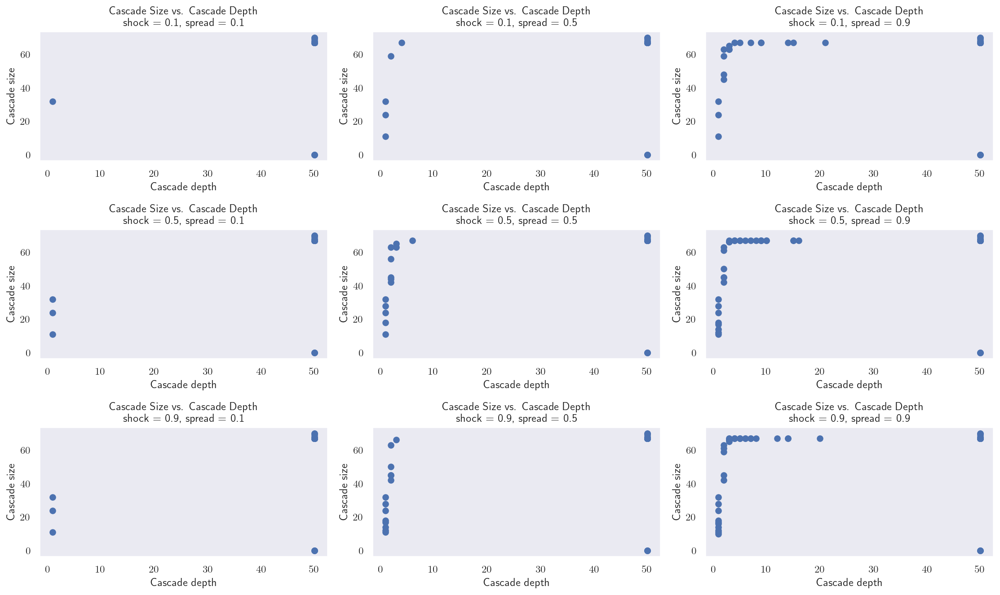

In [73]:
# Run simulation for shock and spread parameters of 0.1, 0.5 and 0.9
fig, ax = plt.subplots(3, 3, figsize = (15, 9))

vals = [0.1, 0.5, 0.9]
for i in range(3):
    for j in range(3):
        metrics_dict = []
        # Construct dataframe of metrics per shock and spread value
        for country in countries:
            df_rows = {}
            res = sim_cascade_2(all_graphs[2017], country, shock_param = vals[i], spread_param = vals[j], k = 50)
            df_rows["Country Code"] = country
            df_rows["cascade size"] = res["cascade size"]
            df_rows["cascade depth"] = res["cascade depth"]
            metrics_dict.append(df_rows)

        metrics_df = pd.DataFrame(metrics_dict)

        ax[i, j].scatter(metrics_df["cascade depth"], metrics_df["cascade size"])
        ax[i, j].set_title("Cascade Size vs. Cascade Depth \n shock = " + str(vals[i]) + ", spread = " + str(vals[j]))
        ax[i, j].set_xlabel("Cascade depth")
        ax[i, j].set_ylabel("Cascade size")
        
fig.tight_layout()

As before, we see a clear divide between core and peripheral nodes for all cases with respect to cascade depth. Moreover, increasing either the shock or spread parameter causes nodes from the right side to move to the left. This makes sense, as increasing the shock/spread parameter increases the size/extent of the shock, leading to less iterations towards equilibrium in general. 

##### 5.2.1.2 Identifying Core, Intermediate and Peripheral Nodes

We can now designate each node as either a core or peripheral node. Following Li et al. (2014), we compute for the minimum value of the shock parameter required to designate a node as a core node, setting the spread parameter equal to 1. In this case, we define a core node as one which requires at most 10 iterations to reach equilibrium, consistent with Figure 5.20. The shock parameter is computed using a modified bisection search algorithm which is run for 100 iterations, during which the computed values for the minimum shock parameter have been found to converge.
After this, we rank the nodes based on the minimum shock parameter. We can then set a threshold shock parameter and designate all countries with a smaller minimum shock parameter as core nodes, with the rest being designated as peripheral nodes. 

In [74]:
#min_shock_2 = {}
#num_iter = 100
#for country in countries:
#    high = 1
#    low = 0
    
#    for i in range(num_iter):
#        shock = (high + low) / 2
#        res = sim_cascade_2(all_graphs[2017], country, shock_param = shock, spread_param = 1, k = 50)
#        if res["cascade depth"] > 10:
#            low = shock
#        elif res["cascade depth"] <= 10:
#            high = shock
            
#    min_shock_2[country] = shock
    
#min_shock_2_df = pd.DataFrame.from_dict(min_shock_2, orient = "index")
#min_shock_2_df.rename(columns = {0: "shock"}, inplace = True)
#min_shock_2_df.reset_index(inplace = True)
#min_shock_2_df.rename(columns = {"index": "Country Code"}, inplace = True)
#min_shock_2_df.to_csv(os.path.join(output_dir, "min_shock_imports.csv"), index = False)

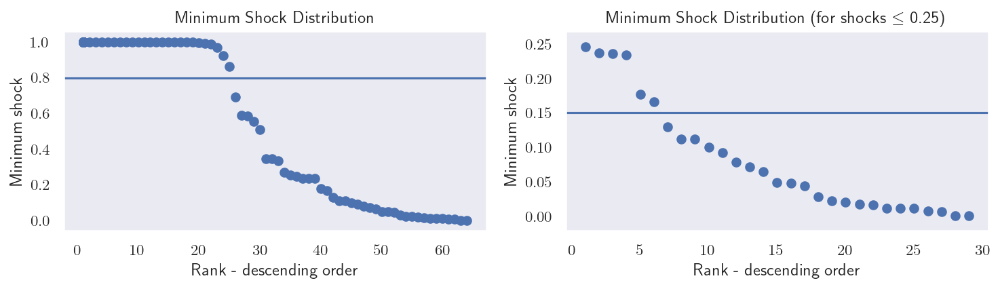

In [75]:
# Load min_shock_exports
min_shock_2_df = pd.read_csv("Simulation Results/min_shock_imports.csv", header = 0)

# Remove all countries for which min_shock_2_df = 1
#min_shock_2_df = min_shock_2_df[min_shock_2_df["shock"] != 1]

# Plot distribution of cascade depth
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (10, 3))

# Construct list of y-values. Remove 0's in the list
y_list = sorted(min_shock_2_df["shock"], reverse = True)
y_list_short = np.array([i for i in y_list if i < 0.25])

# Construct list of x-values
x_list = stats.rankdata(np.negative(y_list), method = "dense")
x_list_short = stats.rankdata(np.negative(y_list_short), method = "dense")

ax1.scatter(x_list, y_list)
ax1.axhline(y = 0.8)
ax1.set_title("Minimum Shock Distribution")
ax1.set_xlabel("Rank - descending order")
ax1.set_ylabel("Minimum shock")

ax2.scatter(x_list_short, y_list_short)
ax2.axhline(y = 0.15)
ax2.set_title("Minimum Shock Distribution (for shocks $\\leq$ 0.25)")
ax2.set_xlabel("Rank - descending order")
ax2.set_ylabel("Minimum shock")

fig.tight_layout()

In [100]:
# Set threshold shock parameter to 5e-4
threshold1 = 0.8
threshold2 = 0.150
inner_core = min_shock_2_df[min_shock_2_df["shock"] <= threshold2]["Country Code"].tolist()
outer_core = min_shock_2_df[(min_shock_2_df["shock"] > threshold2) & (min_shock_2_df["shock"] <= threshold1)]["Country Code"].tolist()
periphery = min_shock_2_df[min_shock_2_df["shock"] > threshold1]["Country Code"].tolist()
print("inner core: ", inner_core)
print("outer core: ", outer_core)
print("periphery: ", periphery)

# Create dataframe countries_df
countries_df = pd.DataFrame(list(all_graphs[2017].nodes), columns = ["Country Code"])
countries_df["Designation"] = 0

# Add designation
for country in core:
    countries_df.loc[countries_df["Country Code"] == country, "Designation"] = "inner core"

for country in intermediate:
    countries_df.loc[countries_df["Country Code"] == country, "Designation"] = "outer core"
    
for country in periphery:
    countries_df.loc[countries_df["Country Code"] == country, "Designation"] = "periphery"

# Remove all other countries
countries_df = countries_df[countries_df["Designation"] != 0]

inner core:  ['CZE', 'KOR', 'VNM', 'HKG', 'RUS', 'MYS', 'CHN', 'HUN', 'ROU', 'POL', 'PHL', 'DEU', 'MEX', 'BRA', 'NLD', 'USA', 'FRA', 'IDN', 'ITA', 'IND', 'SGP', 'CAN', 'JPN']
outer core:  ['ISR', 'PRT', 'TUR', 'DNK', 'ESP', 'BEL', 'CHE', 'SVK', 'TUN', 'IRL', 'AUS', 'AUT', 'EST', 'GBR', 'FIN', 'SWE']
periphery:  ['GTM', 'BGR', 'ARE', 'TZA', 'NOR', 'GEO', 'ARG', 'GUY', 'MNE', 'MKD', 'NAM', 'PRY', 'SAU', 'LVA', 'MAR', 'MWI', 'BHR', 'DZA', 'LBN', 'ZWE', 'SWZ', 'ISL', 'AND', 'GRC', 'LKA', 'BOL', 'UZB', 'NIC', 'URY', 'ZMB', 'JAM', 'BRB', 'PAK', 'ZAF', 'MNG', 'BWA', 'NZL', 'AZE', 'CRI', 'KAZ', 'DOM', 'BRN', 'MDA', 'HND', 'SEN', 'KEN', 'LCA', 'SLV', 'BLR', 'MLT', 'SRB', 'UKR', 'EGY', 'LSO', 'HRV', 'LUX', 'COL', 'ECU', 'MDG', 'CIV', 'SVN', 'LTU', 'CYP', 'PER', 'BIH', 'CHL']


We can visualize the geographic distribution of core and peripheral nodes using a chloropleth map.

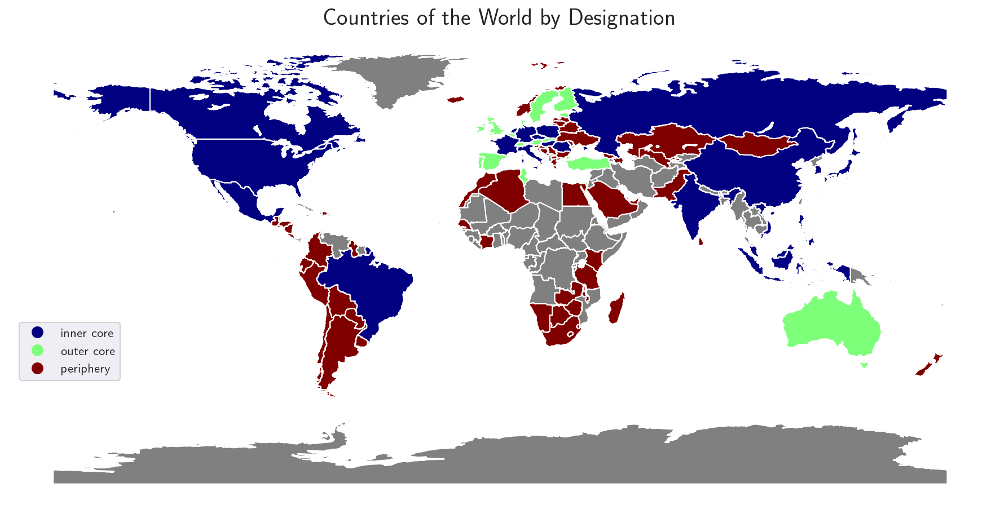

In [101]:
# Merge geodataframe with countries_df
countries_map = gdf.merge(countries_df, how = "left", left_on = "ADM0_A3", right_on = "Country Code")

# Plot gray map
ax = countries_map.plot(color = "gray", figsize = (15, 20))

# Remove countries for which designation is neither core nor periphery
countries_map = countries_map.dropna()

# Assign number to each region
designation_mapping = {"inner core": 0, "outer core": 1, "periphery": 2}
countries_map["Designation No."] = countries_map["Designation"].apply(lambda x: designation_mapping[x])

# Plot map
countries_map.plot(column = "Designation No.", categorical = True, cmap = "jet", figsize = (15, 20), legend = True, ax = ax)
ax.set_title("Countries of the World by Designation", fontdict = {'fontsize': 20})
ax.set_axis_off()

# Modify legend
legend = ax.get_legend()
legend.set_bbox_to_anchor((.12, .4))
for i in range(len(designation_mapping)):
    legend.get_texts()[i].set_text(list(designation_mapping.keys())[i])

In line with earlier observations, the Southeast Asian/East Asian region is a major hub in the IC trade network, along with the US, Germany, France and Ireland. These also happen to be the countries with high out-PageRank centralities.

Core-periphery networks are often characterized by (1) highly central core nodes and sparsely connected peripheral nodes and (2) a significant number of core-core and core-periphery links as opposed to periphery-periphery links. To examine whether this holds in our network, we look at the following metrics. To test the first assumption, we examine: (1) average in-degree centrality, (2) average in-strength centrality, (3) average betweenness centrality and (4) average in-eigenvector centrality. For the second assumption, we look at: (1) average link weight and  (2) normalized number of links.

Starting at the node level,

In [102]:
# Merge
countries_df = countries_df.merge(degree_df, left_on = "Country Code", right_on = "Country Code")
countries_df = countries_df.merge(strength_df, left_on = "Country Code", right_on = "Country Code")
countries_df = countries_df.merge(betweenness_df, left_on = "Country Code", right_on = "Country Code")
countries_df = countries_df.merge(eigenvector_df, left_on = "Country Code", right_on = "Country Code")

# get summary
countries_df.groupby(["Designation"]).mean()

,in-degree,out-degree,in-strength,out-strength,betweenness,in-eigenvector,out-eigenvector
Designation,,,,,,,
inner core,22.2608695652,29.8695652174,0.0423048898,0.0412836177,0.0749707764,0.0867081455,0.0983742789
outer core,19.2500000000,26.0625000000,0.0013494807,0.0029090946,0.0119492158,0.0059744019,0.0291717846
periphery,7.3787878788,3.0757575758,0.0000817552,0.0000595648,0.0027977686,0.0006139597,0.0003422330


We find that core nodes tend to be associated with significantly higher out-degrees, higher out-strength centralities, higher weighted betweenness centralities and higher (weighted) out-PageRank centralities.

We now proceed with examining the network at an edge level.

In [103]:
trade_desig_df = trade_df[trade_df["year"] == 2017]

# Get source - designation
trade_desig_df = trade_desig_df.merge(countries_df[["Country Code", "Designation"]], left_on = "source", right_on = "Country Code")
trade_desig_df.drop(["Country Code"], axis = 1, inplace = True)
trade_desig_df.rename(columns = {"Designation": "source - designation"}, inplace = True)

# Get target - designation
trade_desig_df = trade_desig_df.merge(countries_df[["Country Code", "Designation"]], left_on = "target", right_on = "Country Code")
trade_desig_df.drop(["Country Code"], axis = 1, inplace = True)
trade_desig_df.rename(columns = {"Designation": "target - designation"}, inplace = True)

In [104]:
# Get average link weight
link_weight = trade_desig_df.groupby(["source - designation", "target - designation"])["weight"].mean().reset_index(name = "average link weight")

# Display sorted table
link_weight.sort_values(by = ["average link weight"], ascending = False)

,source - designation,target - designation,average link weight
0,inner core,inner core,966725813.6482058764
3,outer core,inner core,68398425.7554181963
1,inner core,outer core,30874552.0952311717
6,periphery,inner core,9630549.9724778105
4,outer core,outer core,4832637.2390983915
2,inner core,periphery,4285006.1312021175
5,outer core,periphery,1151056.7283702765
8,periphery,periphery,599039.6658264966
7,periphery,outer core,570717.4141119211


In [106]:
# Get count based on values in source - designation and target - designation
count = trade_desig_df.groupby(["source - designation", "target - designation"]).size().reset_index(name = "count")

# Map designations to list of countries
num_designation = {"inner core": len(inner_core), "outer core": len(outer_core), "periphery": len(periphery)}

# Get denominator
count["denom"] = np.where(count["source - designation"] == count["target - designation"], count["source - designation"].apply(lambda x: num_designation[x]) * (count["target - designation"].apply(lambda x: num_designation[x]) - 1), count["source - designation"].apply(lambda x: num_designation[x]) * count["target - designation"].apply(lambda x: num_designation[x]))

# Get normalized count
count["norm_count"] = count["count"] / count["denom"]

# Display sorted table
count[["source - designation", "target - designation", "norm_count"]].sort_values(by = ["norm_count"], ascending = False)

,source - designation,target - designation,norm_count
0,inner core,inner core,0.4881422925
3,outer core,inner core,0.4510869565
1,inner core,outer core,0.4456521739
4,outer core,outer core,0.4166666667
2,inner core,periphery,0.1818181818
5,outer core,periphery,0.1429924242
6,periphery,inner core,0.0652173913
7,periphery,outer core,0.0416666667
8,periphery,periphery,0.0139860140


We find that core-core links tend to have significantly higher weights compared to the rest. This explains why these nodes have been designated as core nodes based on the simulation. 

Moreover, core-intermediate, core-core and intermediate-intermediate links tend to be much more frequent. 

##### 5.2.1.3 Effect of Increasing Shock and Spread Parameters on Cascade Size and Depth

We can now track how varying the shock and spread parameters change the cascade size and depth for the nodes. Because of how we defined core and peripheral nodes, we do not expect to see significant changes in either one when we vary the shock and spread parameters.

We choose Australia, Canada, India, Indonesia, Italy, Morocco, South Africa and Ukraine as representative countries, taking into consideration the geographical distribution of the countries.

We first vary the shock parameter, setting the spread parameter to 0.1, 0.5 and 0.9.

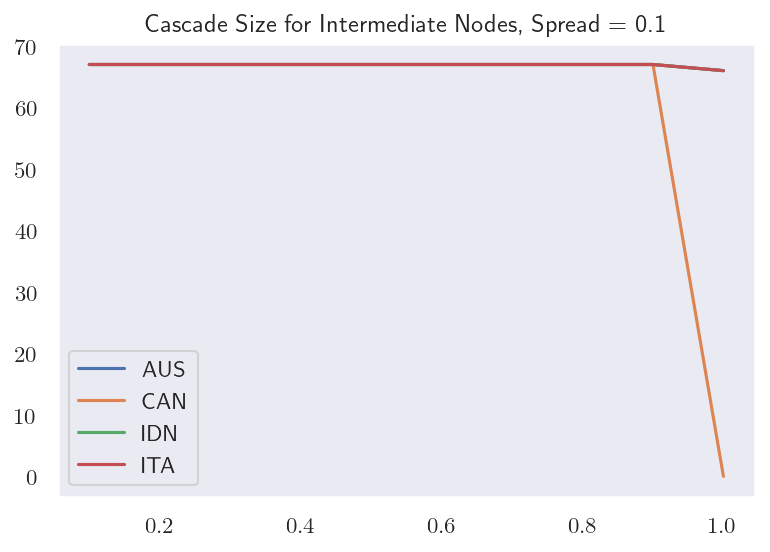

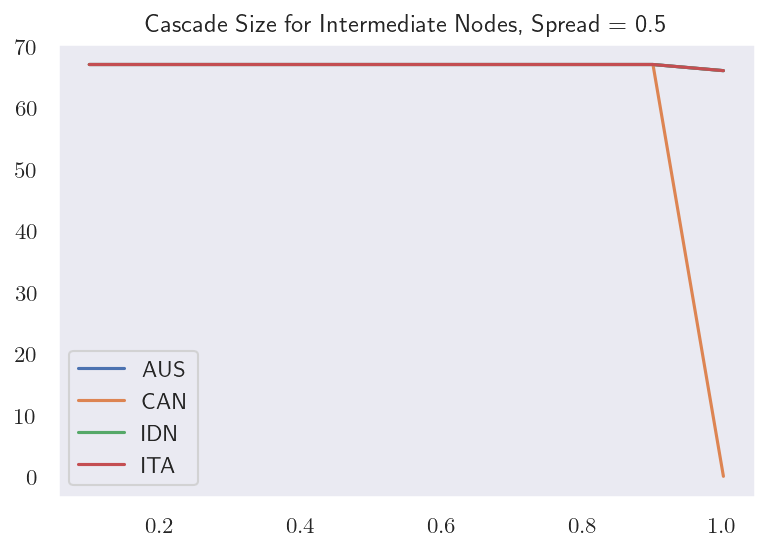

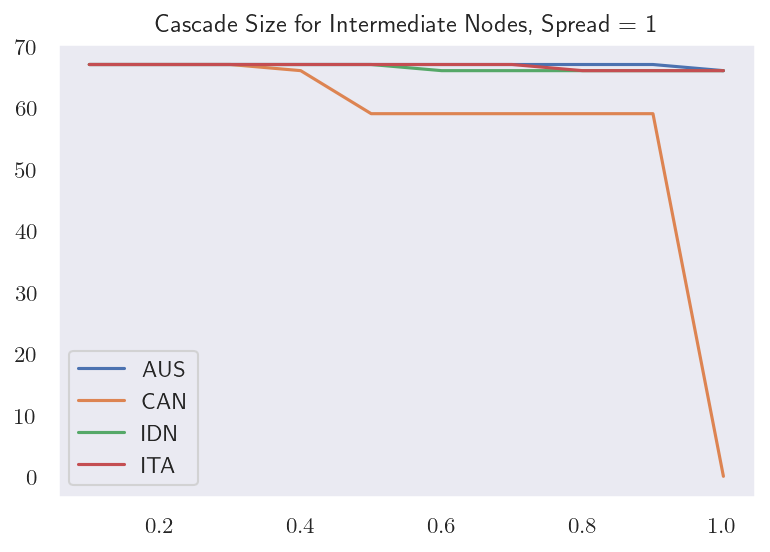

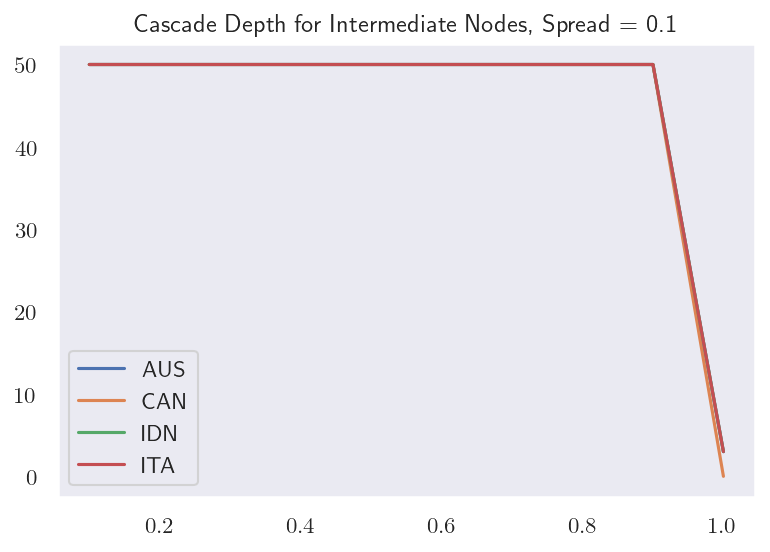

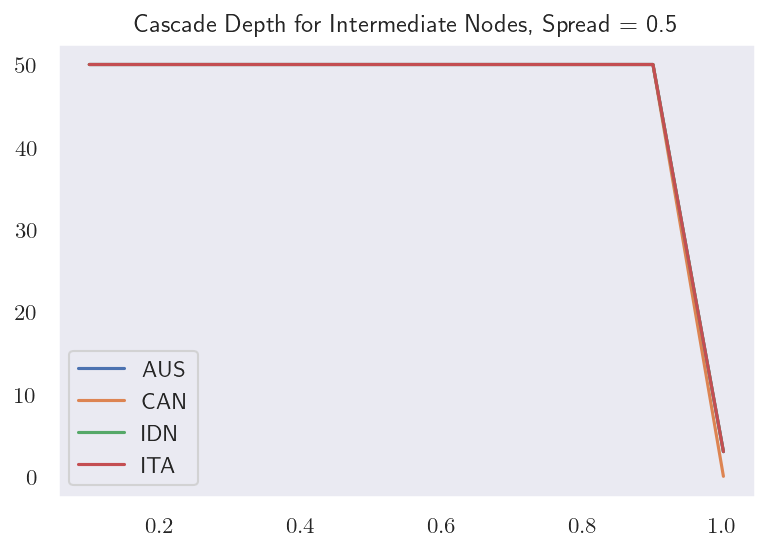

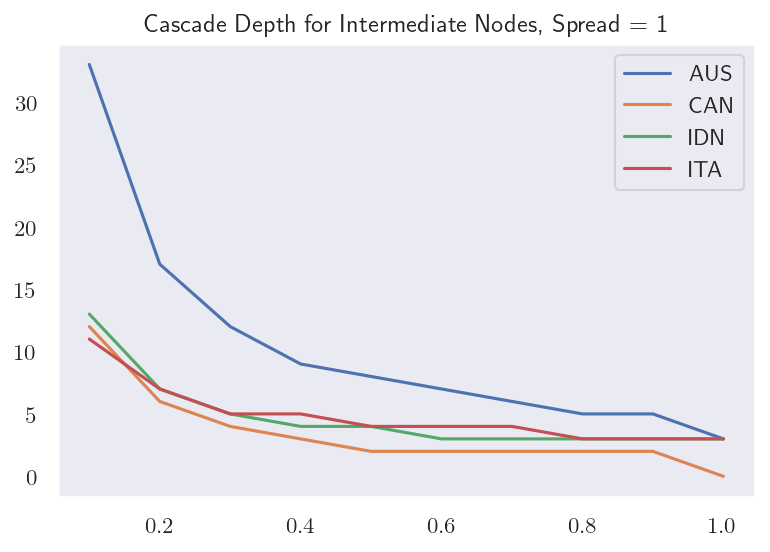

In [82]:
# Get list of cascade sizes and depths
intermediate_reps = ["AUS", "CAN", "IDN", "ITA"]
shock_list = np.arange(0.1, 1.1, 0.1)
spread_list = [0.1, 0.5, 1]

size = {}
depth = {}
for country in intermediate_reps:
    for spread in spread_list:
        size[(country, spread)] = []
        depth[(country, spread)] = []
        for shock in shock_list:
            res = sim_cascade_2(all_graphs[2017], country, shock_param = shock, spread_param = spread, k = 50)
            size[(country, spread)].append(res["cascade size"])
            depth[(country, spread)].append(res["cascade depth"])
        
# Plot cascade size
for spread in spread_list:
    fig, ax = plt.subplots()
    for country in intermediate_reps:
        line, = ax.plot(shock_list, size[(country, spread)], label = country)
        ax.set_title("Cascade Size for Intermediate Nodes, Spread = " + str(spread))
        ax.legend()

# Plot cascade depth
for spread in spread_list:
    fig, ax = plt.subplots()
    for country in intermediate_reps:    
        line, = ax.plot(shock_list, depth[(country, spread)], label = country)
        ax.set_title("Cascade Depth for Intermediate Nodes, Spread = " + str(spread))
        ax.legend()

From the figures, we see that increasing the shock parameter decreases cascade size and depth. This makes sense, as increasing the shock parameter increases the size of the shock, leading to less iterations towards equilibrium. Moreover, because the system now reaches equilibrium faster, it does not affect as many nodes as before. This is because with less iterations, the shock would not have had time to propagate to more nodes in the network. 

We now vary the spred parameter, setting the shock parameter to 0.1, 0.5 and 1.

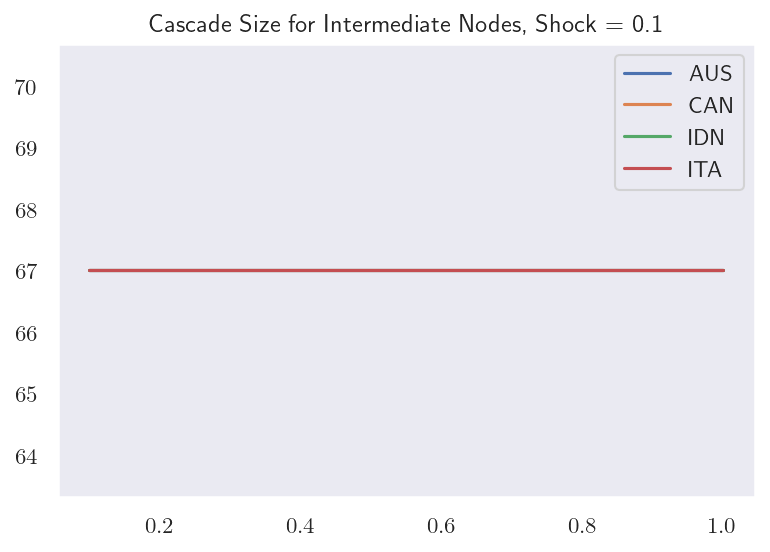

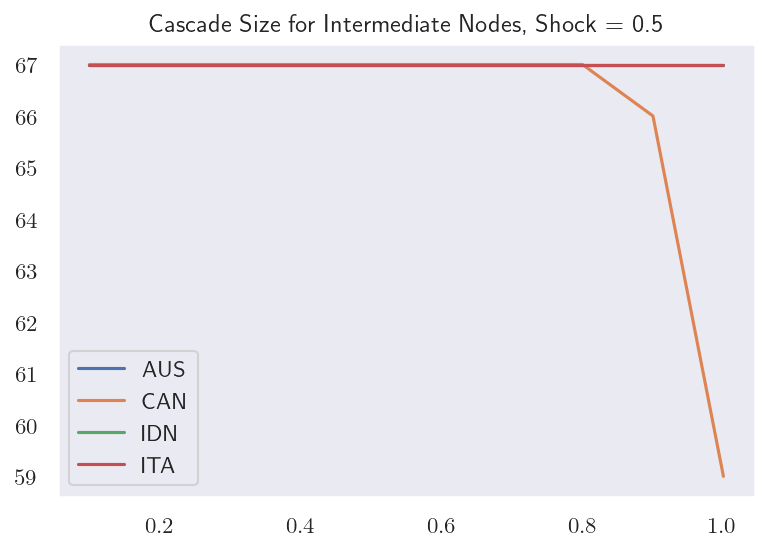

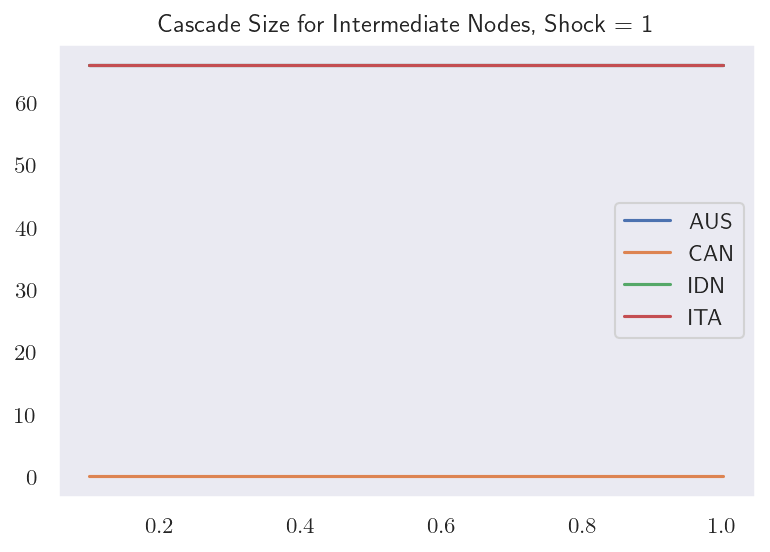

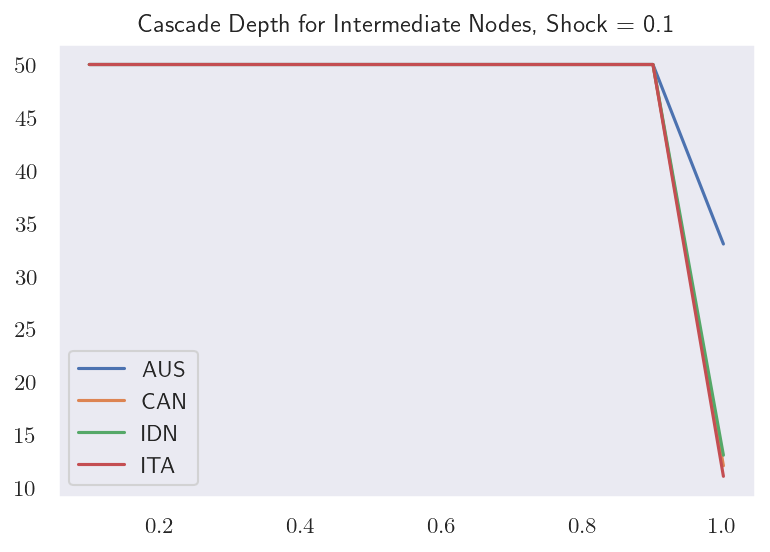

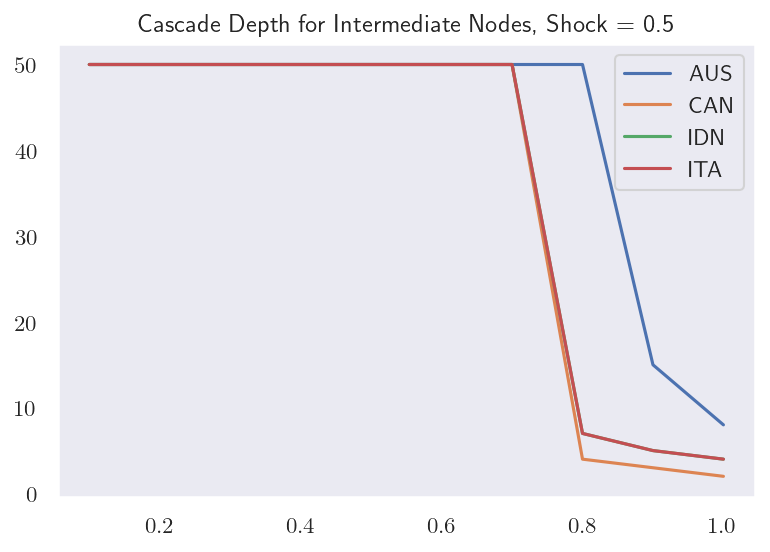

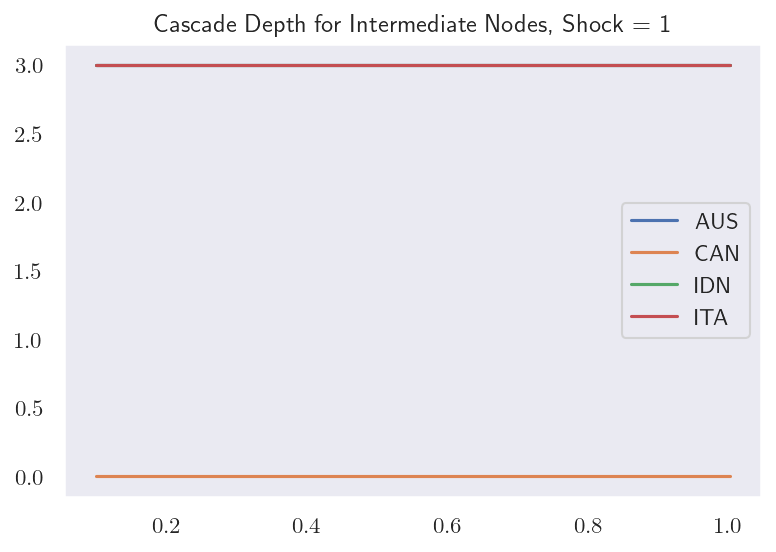

In [83]:
# Get list of cascade sizes and depths
intermediate_reps = ["AUS", "CAN", "IDN", "ITA"]
shock_list = [0.1, 0.5, 1]
spread_list = np.arange(0.1, 1.1, 0.1)

size = {}
depth = {}
for country in intermediate_reps:
    for shock in shock_list:
        size[(country, shock)] = []
        depth[(country, shock)] = []
        for spread in spread_list:
            res = sim_cascade_2(all_graphs[2017], country, shock_param = shock, spread_param = spread, k = 50)
            size[(country, shock)].append(res["cascade size"])
            depth[(country, shock)].append(res["cascade depth"])
        
# Plot cascade size
for shock in shock_list:
    fig, ax = plt.subplots()
    for country in intermediate_reps:
        line, = ax.plot(spread_list, size[(country, shock)], label = country)
        ax.set_title("Cascade Size for Intermediate Nodes, Shock = " + str(shock))
        ax.legend()

# Plot cascade depth
for shock in shock_list:
    fig, ax = plt.subplots()
    for country in intermediate_reps:    
        line, = ax.plot(spread_list, depth[(country, shock)], label = country)
        ax.set_title("Cascade Depth for Intermediate Nodes, Shock = " + str(shock))
        ax.legend()

In a similar vein, we see that increasing the spread parameter decreases cascade size and depth. This makes sense, as increasing the spread parameter increases the extent of the shock, leading to less iterations towards equilibrium. Moreover, because the system now reaches equilibrium faster, it does not affect as many nodes as before. This is because with less iterations, the shock would not have had time to propagate to more nodes in the network. 

#### 5.2.2 Exposure

In [84]:
# Load sim1_exposure.csv as dataframe and convert to numpy array. 
exposure_df = pd.read_csv("Simulation Results/sim2_exposure.csv", index_col = 0)

# Compute average and maximum exposure
exposure_countries_df = pd.DataFrame(list(exposure_df.columns), columns = ["Country Code"])

exposure_df["source"] = exposure_df.idxmax(axis = 0)
exposure_df["recipient"] = exposure_df.drop(["source"], axis = 1).idxmax(axis = 1)
exposure_df["maximum exposure given"] = exposure_df.max(axis = 0)
exposure_df["maximum exposure received"] = exposure_df.max(axis = 1)

exposure_countries_df = exposure_countries_df.merge(exposure_df[["source", "recipient", "maximum exposure given", "maximum exposure received"]], left_on = "Country Code", right_on = exposure_df.index)

exposure_df.drop(["source", "recipient", "maximum exposure given", "maximum exposure received"], axis = 1, inplace = True)

##### 5.2.2.1 Exposure in the Context of the Philippines

We wish to know which countries are affected by shocks from the Philippines, as well as which countries' shocks affect the Philippines the most. 

In [85]:
exposure_countries_df[exposure_countries_df["Country Code"] == "PHL"]

,Country Code,source,recipient,maximum exposure given,maximum exposure received
60,PHL,SGP,KOR,0.0882802430,0.2168246753


We find that the Philippines is affected by South Korea the most, with the country being exposed to 21.68% of the shock from South Korea on average. Meanwhile, the Philippines affects Singapore the most, with the country being exposed to 8.82% of the shocks from the Philippines on average.

We can look into the exposure matrix to see the top 10 countries most susceptible to shocks from the Philippines and the top 10 countries whose shocks the Philippines is the most susceptible to.

In [86]:
exposure_df.loc["PHL", :].sort_values(ascending = False).head(10)

KOR   0.2168246753
USA   0.1519925691
JPN   0.0836142176
IRL   0.0360864373
MYS   0.0292577817
SGP   0.0214444666
ISR   0.0070685452
ITA   0.0067494026
BEL   0.0064295498
FRA   0.0049168955
Name: PHL, dtype: float64

In [87]:
exposure_df.loc[:, "PHL"].sort_values(ascending = False).head(10)

SGP   0.0882802430
DEU   0.0695426272
FRA   0.0510759890
NLD   0.0481932111
MYS   0.0441913096
HUN   0.0392266581
POL   0.0379054991
HKG   0.0338060255
ROU   0.0334363579
ITA   0.0330343353
Name: PHL, dtype: float64

##### 5.2.1.2 Maximum Exposure Values in the Trade Network

We can also obtain the largest maximum exposure values in the trade network.

In [88]:
exposure_countries_df.sort_values(by = ["maximum exposure given"], ascending = False).head(10)

,Country Code,source,recipient,maximum exposure given,maximum exposure received
19,KOR,VNM,USA,0.2651226357,0.2122703136
75,USA,KOR,MYS,0.2122703136,0.1696142819
33,MYS,USA,VNM,0.1696142819,0.1128862643
56,IRL,USA,GBR,0.1513608690,0.0378225895
95,SGP,HKG,KOR,0.1395565464,0.1691001213
103,JPN,KOR,SGP,0.1305160740,0.1240641896
61,DEU,HUN,MYS,0.1196563146,0.0971199717
21,VNM,MYS,KOR,0.1128862643,0.2651226357
60,PHL,SGP,KOR,0.0882802430,0.2168246753
74,NLD,POL,MYS,0.0763014323,0.0906452899


In [89]:
exposure_countries_df.sort_values(by = ["maximum exposure received"], ascending = False).head(10)

,Country Code,source,recipient,maximum exposure given,maximum exposure received
21,VNM,MYS,KOR,0.1128862643,0.2651226357
60,PHL,SGP,KOR,0.0882802430,0.2168246753
19,KOR,VNM,USA,0.2651226357,0.2122703136
75,USA,KOR,MYS,0.2122703136,0.1696142819
95,SGP,HKG,KOR,0.1395565464,0.1691001213
36,CHN,BRA,KOR,0.0548392125,0.1642747605
66,BRA,RUS,KOR,0.0000045434,0.1456671618
27,HKG,CHN,SGP,0.0678872502,0.1395565464
63,MEX,RUS,MYS,0.0011681357,0.1302988127
103,JPN,KOR,SGP,0.1305160740,0.1240641896


The exposure matrix is not symmetric, so the maximum exposure given and received are not always similar. We can see, however, that there is a great deal of overlap between the two tables above.

In [90]:
min_shock = min_shock_1_df.merge(min_shock_2_df, left_on = "Country Code", right_on = "Country Code", suffixes = ("_1", "_2"))
min_shock = min_shock.merge(in_eigenvector_df, left_on = "Country Code", right_on = "Country Code")
min_shock = min_shock.merge(out_eigenvector_df, left_on = "Country Code", right_on = "Country Code")
min_shock = min_shock.merge(in_strength_df, left_on = "Country Code", right_on = "Country Code")
min_shock = min_shock.merge(out_strength_df, left_on = "Country Code", right_on = "Country Code")
min_shock = min_shock.merge(betweenness_df, left_on = "Country Code", right_on = "Country Code")
min_shock

,Country Code,shock_1,shock_2,in-eigenvector,out-eigenvector,in-strength,out-strength,betweenness
0,LTU,0.1915080910,0.9993343063,0.0014669449,0.0000017946,0.0002455840,0.0000301659,0.0000000000
1,KEN,0.9999848830,0.9999923453,0.0000008630,0.0000054066,0.0000003077,0.0000001876,0.0000000000
2,GRC,0.3776315770,0.9997068981,0.0004810168,0.0000439344,0.0001395097,0.0000294772,0.0061613144
3,SRB,0.9817979830,0.9999899347,0.0006522299,0.0000002226,0.0001566053,0.0000007424,0.0000000000
4,BLR,0.0284410220,0.9989734645,0.0000931899,0.0006051734,0.0000423787,0.0002011526,0.0089619119
...,...,...,...,...,...,...,...,...
100,GEO,0.9998339990,0.9999987379,0.0001231423,0.0000000071,0.0000139347,0.0000001536,0.0000000000
101,DEU,0.0001075690,0.0164362499,0.0180081995,0.0091415481,0.0234046785,0.0244284761,0.2115384615
102,ESP,0.0057816060,0.1769234607,0.0103201784,0.0000699035,0.0023530622,0.0003987117,0.0599327857
103,LKA,0.1453456800,0.9999745845,0.0000370423,0.0000011633,0.0000726585,0.0000134985,0.0000000000


C:\Users\JM\Anaconda3\lib\site-packages\pandas\core\series.py:853: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


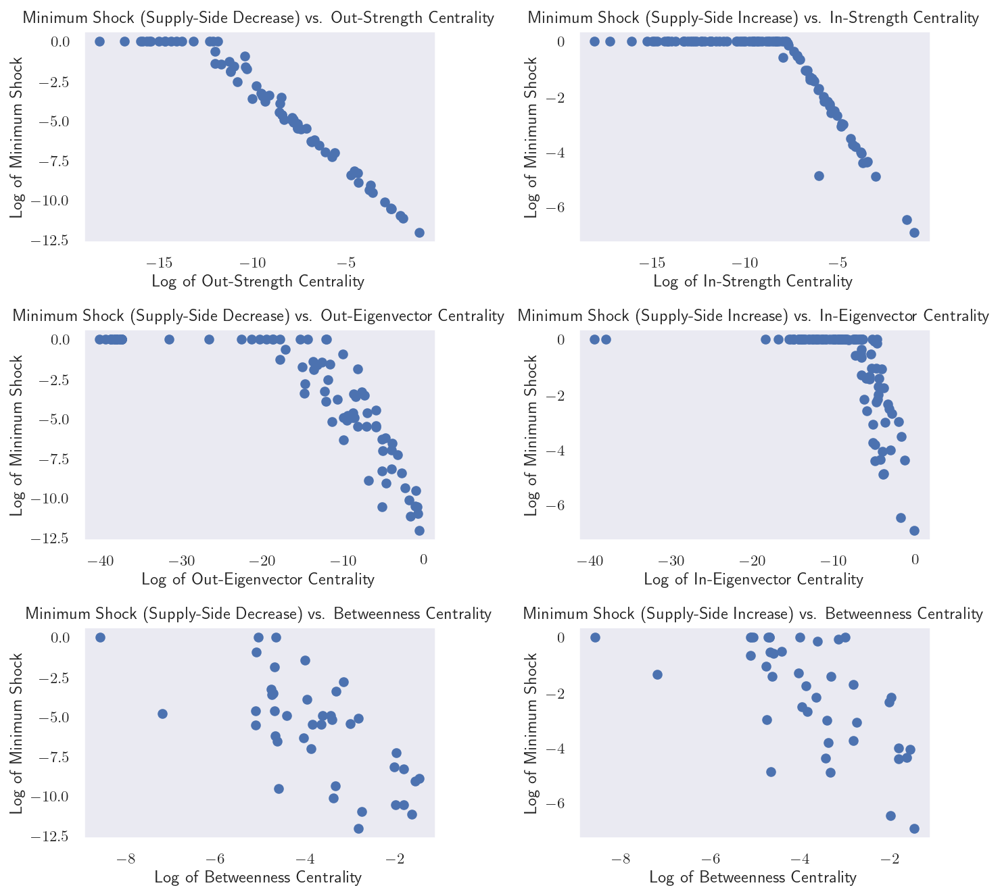

In [91]:
fig, ax = plt.subplots(3, 2, figsize = (10, 9))

ax[0, 0].scatter(np.log(min_shock["out-strength"]), np.log(min_shock["shock_1"]))
ax[0, 0].set_title("Minimum Shock (Supply-Side Decrease) vs. Out-Strength Centrality")
ax[0, 0].set_xlabel("Log of Out-Strength Centrality")
ax[0, 0].set_ylabel("Log of Minimum Shock")

ax[0, 1].scatter(np.log(min_shock["in-strength"]), np.log(min_shock["shock_2"]))
ax[0, 1].set_title("Minimum Shock (Supply-Side Increase) vs. In-Strength Centrality")
ax[0, 1].set_xlabel("Log of In-Strength Centrality")
ax[0, 1].set_ylabel("Log of Minimum Shock")

ax[1, 0].scatter(np.log(min_shock["out-eigenvector"]), np.log(min_shock["shock_1"]))
ax[1, 0].set_title("Minimum Shock (Supply-Side Decrease) vs. Out-Eigenvector Centrality")
ax[1, 0].set_xlabel("Log of Out-Eigenvector Centrality")
ax[1, 0].set_ylabel("Log of Minimum Shock")

ax[1, 1].scatter(np.log(min_shock["in-eigenvector"]), np.log(min_shock["shock_2"]))
ax[1, 1].set_title("Minimum Shock (Supply-Side Increase) vs. In-Eigenvector Centrality")
ax[1, 1].set_xlabel("Log of In-Eigenvector Centrality")
ax[1, 1].set_ylabel("Log of Minimum Shock")

ax[2, 0].scatter(np.log(min_shock["betweenness"]), np.log(min_shock["shock_1"]))
ax[2, 0].set_title("Minimum Shock (Supply-Side Decrease) vs. Betweenness Centrality")
ax[2, 0].set_xlabel("Log of Betweenness Centrality")
ax[2, 0].set_ylabel("Log of Minimum Shock")

ax[2, 1].scatter(np.log(min_shock["betweenness"]), np.log(min_shock["shock_2"]))
ax[2, 1].set_title("Minimum Shock (Supply-Side Increase) vs. Betweenness Centrality")
ax[2, 1].set_xlabel("Log of Betweenness Centrality")
ax[2, 1].set_ylabel("Log of Minimum Shock")

fig.tight_layout()